## TODO:

1. Previous code didn't calculate Renyi divergence correctly. Now fixed using empirical distributions.
2. Fixed issues when calculating whole dataset divergence (X, y), where y is binary.
3. Added new settings to have label shift and covariate shift at the same time.

## 1-D Classification - Only Feature Divergences

EXPERIMENT 1: Delta (Mean) Shift (10 repeats)


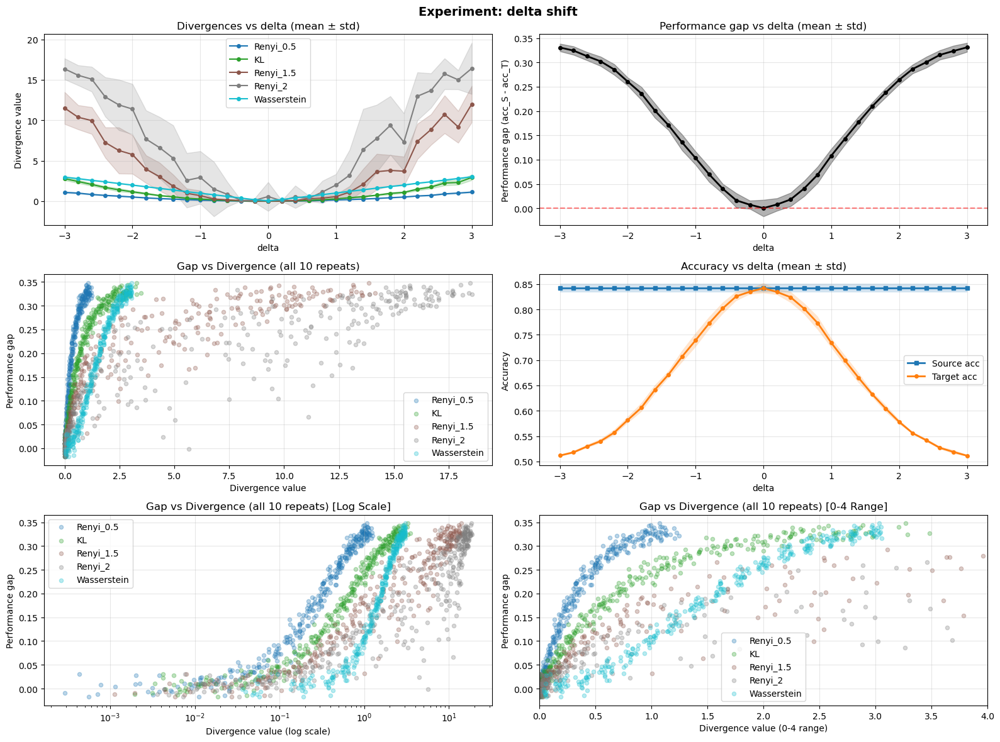


Aggregated results (first 10 rows):
           gap                  KL           Wasserstein          
          mean       std      mean       std        mean       std
param                                                             
-3.0   0.33065  0.007771  2.779255  0.201981    2.979023  0.034436
-2.8   0.32430  0.008648  2.431711  0.191632    2.787597  0.036830
-2.6   0.31275  0.008457  2.065616  0.173440    2.577092  0.042756
-2.4   0.30220  0.009601  1.690352  0.160425    2.393080  0.021191
-2.2   0.28540  0.010931  1.400506  0.198793    2.187939  0.030936
-2.0   0.26045  0.008241  1.159439  0.126352    1.989508  0.030756
-1.8   0.23625  0.013342  0.936624  0.093507    1.788115  0.030060
-1.6   0.20080  0.014754  0.691498  0.053104    1.586174  0.026894
-1.4   0.17090  0.010115  0.545784  0.042130    1.388078  0.039637
-1.2   0.13555  0.016227  0.364060  0.049751    1.174433  0.030234

EXPERIMENT 2: Prior Probability Shift (10 repeats)


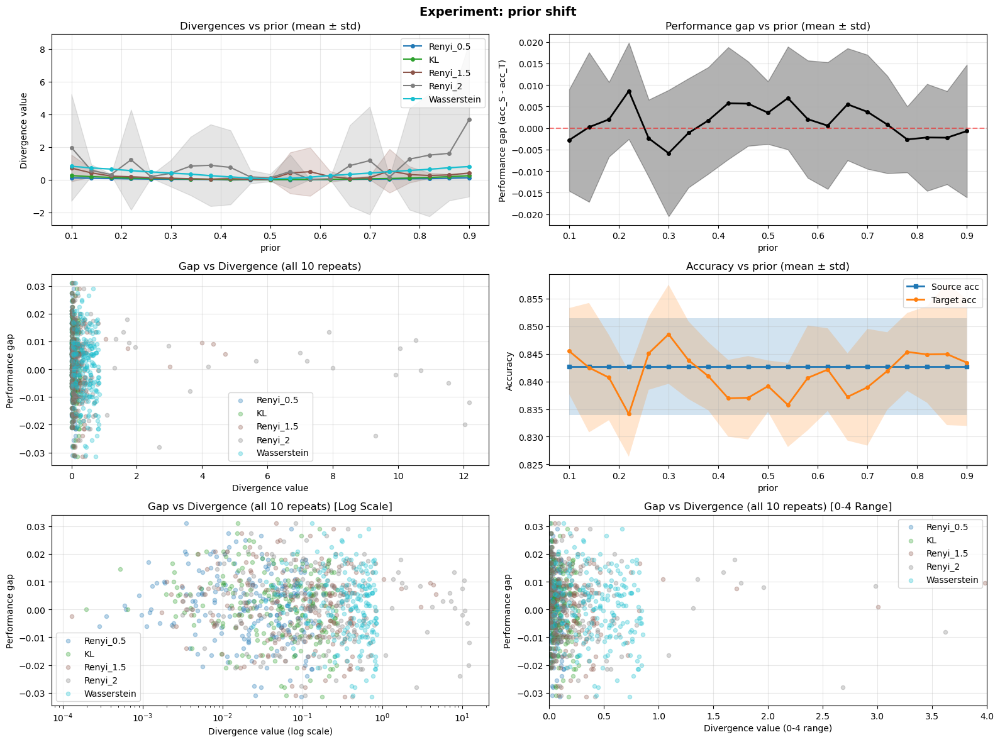


Aggregated results (first 10 rows):
           gap                  KL           Wasserstein          
          mean       std      mean       std        mean       std
param                                                             
0.10  -0.00280  0.011797  0.246869  0.018417    0.818916  0.024753
0.14   0.00020  0.017350  0.181972  0.016102    0.718174  0.036530
0.18   0.00200  0.008660  0.137901  0.017037    0.645365  0.019799
0.22   0.00860  0.011175  0.096822  0.006436    0.549761  0.036196
0.26  -0.00240  0.008972  0.070059  0.012697    0.476437  0.037349
0.30  -0.00585  0.014661  0.049595  0.008161    0.400840  0.033434
0.34  -0.00115  0.012662  0.036051  0.008350    0.338674  0.028899
0.38   0.00175  0.012374  0.020415  0.008116    0.241729  0.038551
0.42   0.00575  0.013007  0.013291  0.005769    0.168938  0.023059
0.46   0.00565  0.009801  0.007477  0.007026    0.090939  0.030158

EXPERIMENT 3: Variance Shift (10 repeats)


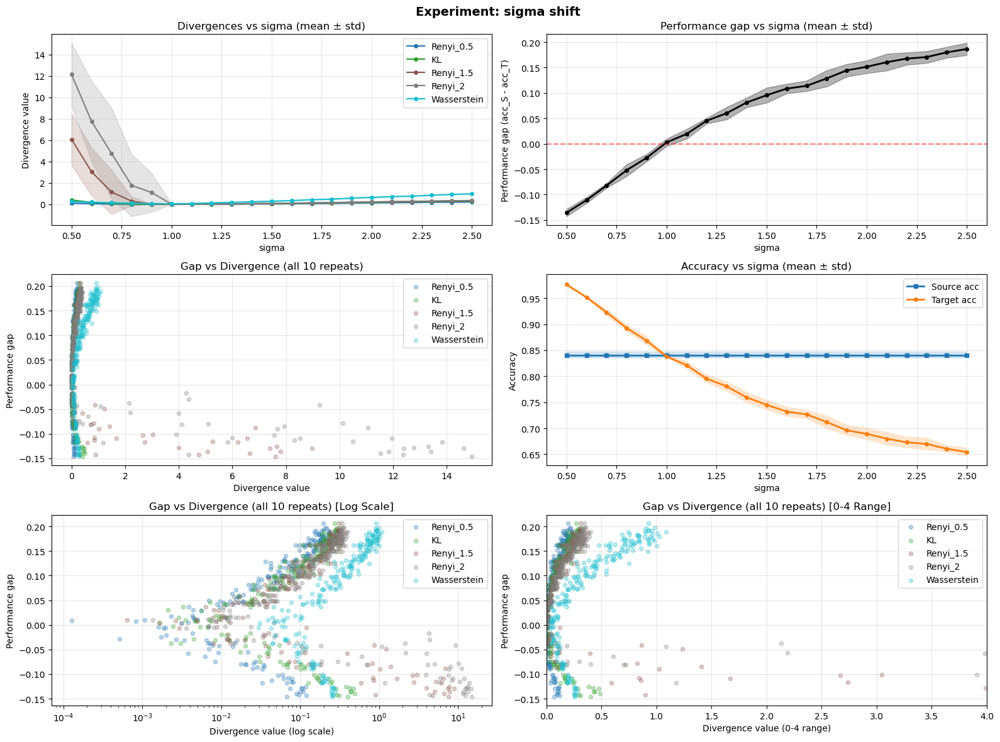


Aggregated results (first 10 rows):
           gap                  KL           Wasserstein          
          mean       std      mean       std        mean       std
param                                                             
0.5   -0.13565  0.007219  0.392735  0.074092    0.258466  0.009124
0.6   -0.11100  0.005878  0.185306  0.042012    0.198884  0.011621
0.7   -0.08225  0.004614  0.085795  0.022934    0.146138  0.010700
0.8   -0.05210  0.011704  0.034528  0.010669    0.099071  0.011002
0.9   -0.02775  0.007277  0.011674  0.007582    0.069700  0.022922
1.0    0.00270  0.007277  0.003346  0.002781    0.047109  0.012264
1.1    0.01935  0.009652  0.007204  0.003171    0.074270  0.022020
1.2    0.04525  0.005499  0.019161  0.007125    0.131950  0.034877
1.3    0.06010  0.012256  0.029960  0.006817    0.180064  0.019666
1.4    0.08120  0.009364  0.048832  0.006913    0.236911  0.036239

SUMMARY: Correlation between divergences and performance gap

Delta shift:
  Renyi_0.5     

In [1]:
import numpy as np
import pandas as pd
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from scipy.stats import norm, entropy, wasserstein_distance
from scipy.spatial.distance import cdist
import matplotlib.pyplot as plt
from scipy.stats import gaussian_kde

np.random.seed(42)

# ======================================================
# 1. Data generation
# ======================================================
def generate_1d_clf_data(n, mu0, mu1, sigma, prior=0.5):
    n1 = int(n * prior)
    n0 = n - n1
    X0 = np.random.normal(mu0, sigma, n0)
    X1 = np.random.normal(mu1, sigma, n1)
    X = np.concatenate([X0, X1])
    y = np.array([0]*n0 + [1]*n1)
    return X.reshape(-1,1), y

# ======================================================
# 2. Divergence functions
# ======================================================
def renyi_divergence_1d(data_p, data_q, alpha=1.5, n_samples=2000, bw_method='scott'):
    if alpha <= 0:
        raise ValueError("Alpha must be > 0")
    if alpha == 1.0:
        raise ValueError("For alpha=1, use KL divergence instead.")
    
    # KDEs
    kde_p = gaussian_kde(data_p, bw_method=bw_method)
    kde_q = gaussian_kde(data_q, bw_method=bw_method)
    
    # Sample from KDE of P
    samples = kde_p.resample(n_samples).flatten()
    
    # Evaluate densities
    p_vals = kde_p(samples)
    q_vals = kde_q(samples)
    
    # Avoid zeros
    mask = (p_vals > 1e-12) & (q_vals > 1e-12)
    p_vals = p_vals[mask]
    q_vals = q_vals[mask]
    
    ratio = (p_vals ** (alpha-1)) * (q_vals ** (1 - alpha))
    D_alpha = (1.0 / (alpha - 1)) * np.log(np.mean(ratio))
    return D_alpha


def kl_divergence_1d(data_p, data_q, n_samples=2000, bw_method='scott'):

    kde_p = gaussian_kde(data_p, bw_method=bw_method)
    kde_q = gaussian_kde(data_q, bw_method=bw_method)

    # Sample from KDE of P
    samples = kde_p.resample(n_samples).flatten()

    # Evaluate densities
    p_vals = kde_p(samples)
    q_vals = kde_q(samples)

    # Avoid zero densities
    mask = (p_vals > 1e-12) & (q_vals > 1e-12)
    p_vals = p_vals[mask]
    q_vals = q_vals[mask]

    D_kl = np.mean(np.log(p_vals / q_vals))
    return D_kl

def js_divergence_1d(x, y, bins=100):
    """Jensen-Shannon divergence via histogram approximation."""
    p_hist, edges = np.histogram(x, bins=bins, density=True)
    q_hist, _ = np.histogram(y, bins=edges, density=True)
    p_hist = p_hist / (p_hist.sum() + 1e-10)
    q_hist = q_hist / (q_hist.sum() + 1e-10)
    p_hist += 1e-10
    q_hist += 1e-10
    m = 0.5 * (p_hist + q_hist)
    return 0.5 * (entropy(p_hist, m) + entropy(q_hist, m))

def mmd_1d(x, y, sigma=1.0):
    """Maximum Mean Discrepancy with RBF kernel."""
    x = x.reshape(-1, 1)
    y = y.reshape(-1, 1)
    Kxx = np.exp(-cdist(x, x, 'sqeuclidean') / (2 * sigma**2))
    Kyy = np.exp(-cdist(y, y, 'sqeuclidean') / (2 * sigma**2))
    Kxy = np.exp(-cdist(x, y, 'sqeuclidean') / (2 * sigma**2))
    mmd = np.mean(Kxx) + np.mean(Kyy) - 2 * np.mean(Kxy)
    return float(max(0, mmd))

def compute_divergences(Z_S, Z_T):

    return {
        "Renyi_0.5": renyi_divergence_1d(Z_S, Z_T, alpha=0.5),
        "Renyi_1.5": renyi_divergence_1d(Z_S, Z_T, alpha=1.5),
        "Renyi_2": renyi_divergence_1d(Z_S, Z_T, alpha=2.0),
        "KL": kl_divergence_1d(Z_S, Z_T),
        # "JS": js_divergence_1d(Z_S, Z_T),
        # "MMD": mmd_1d(Z_S, Z_T),
        "Wasserstein": wasserstein_distance(Z_S, Z_T)
    }

# ======================================================
# 3. Experiments with different parameters
# ======================================================
def run_delta_shift_experiment(n_repeats=10):
    """Vary delta (mean shift) while keeping prior and variance fixed."""
    n = 2000
    mu0, mu1, sigma = 0.0, 2.0, 1.0
    prior = 0.5

    deltas = np.linspace(-3, 3, 31)
    results = []

    for repeat in range(n_repeats):
        # Generate new source data for each repeat
        X_S, y_S = generate_1d_clf_data(n, mu0, mu1, sigma, prior)
        clf = LogisticRegression().fit(X_S, y_S)
        acc_S = accuracy_score(y_S, clf.predict(X_S))

        for delta in deltas:
            X_T, y_T = generate_1d_clf_data(n, mu0+delta, mu1+delta, sigma, prior)
            acc_T = accuracy_score(y_T, clf.predict(X_T))
            gap = acc_S - acc_T

            Z_S = X_S.flatten()
            Z_T = X_T.flatten()
            divs = compute_divergences(Z_S, Z_T)

            results.append({
                "repeat": repeat,
                "param": delta,
                "param_name": "delta",
                "acc_S": acc_S,
                "acc_T": acc_T,
                "gap": gap,
                **divs
            })

    return pd.DataFrame(results)

def run_prior_shift_experiment(n_repeats=10):
    """Vary target prior while keeping source prior, delta, and variance fixed."""
    n = 2000
    mu0, mu1, sigma = 0.0, 2.0, 1.0
    prior_S = 0.5

    priors_T = np.linspace(0.1, 0.9, 21)
    results = []

    for repeat in range(n_repeats):
        # Generate new source data for each repeat
        X_S, y_S = generate_1d_clf_data(n, mu0, mu1, sigma, prior_S)
        clf = LogisticRegression().fit(X_S, y_S)
        acc_S = accuracy_score(y_S, clf.predict(X_S))

        for prior_T in priors_T:
            X_T, y_T = generate_1d_clf_data(n, mu0, mu1, sigma, prior_T)
            acc_T = accuracy_score(y_T, clf.predict(X_T))
            gap = acc_S - acc_T

            Z_S = X_S.flatten()
            Z_T = X_T.flatten()
            divs = compute_divergences(Z_S, Z_T)

            results.append({
                "repeat": repeat,
                "param": prior_T,
                "param_name": "prior",
                "acc_S": acc_S,
                "acc_T": acc_T,
                "gap": gap,
                **divs
            })

    return pd.DataFrame(results)

def run_variance_shift_experiment(n_repeats=10):
    """Vary target variance while keeping prior, delta, and source variance fixed."""
    n = 2000
    mu0, mu1, sigma_S = 0.0, 2.0, 1.0
    prior = 0.5

    sigmas_T = np.linspace(0.5, 2.5, 21)
    results = []

    for repeat in range(n_repeats):
        # Generate new source data for each repeat
        X_S, y_S = generate_1d_clf_data(n, mu0, mu1, sigma_S, prior)
        clf = LogisticRegression().fit(X_S, y_S)
        acc_S = accuracy_score(y_S, clf.predict(X_S))

        for sigma_T in sigmas_T:
            X_T, y_T = generate_1d_clf_data(n, mu0, mu1, sigma_T, prior)
            acc_T = accuracy_score(y_T, clf.predict(X_T))
            gap = acc_S - acc_T

            Z_S = X_S.flatten()
            Z_T = X_T.flatten()
            divs = compute_divergences(Z_S, Z_T)

            results.append({
                "repeat": repeat,
                "param": sigma_T,
                "param_name": "sigma",
                "acc_S": acc_S,
                "acc_T": acc_T,
                "gap": gap,
                **divs
            })

    return pd.DataFrame(results)

# ======================================================
# 4. Visualization
# ======================================================
def plot_experiment_results(df, title_suffix=""):
    """Create comprehensive plots for an experiment with error bars."""
    param_name = df['param_name'].iloc[0]

    # Aggregate statistics across repeats (excluding string columns)
    numeric_cols = ['acc_S', 'acc_T', 'gap', 'Renyi_0.5', 'KL',
                    'Renyi_1.5', 'Renyi_2',
                    # 'JS', 'MMD', 
                    'Wasserstein']
    
    df_agg = df.groupby('param')[numeric_cols].agg(['mean', 'std']).reset_index()

    fig, axes = plt.subplots(3, 2, figsize=(16, 12))

    div_measures = ["Renyi_0.5", "KL", "Renyi_1.5", "Renyi_2",
                    # "JS", "MMD", 
                    "Wasserstein"]
    colors = plt.cm.tab10(np.linspace(0, 1, len(div_measures)))

    param_values = df_agg['param'].values

    # Plot 1: Divergence vs parameter (with error bars)
    ax = axes[0, 0]
    for div, color in zip(div_measures, colors):
        mean_vals = df_agg[div]['mean'].values
        std_vals = df_agg[div]['std'].values
        ax.plot(param_values, mean_vals, label=div, marker='o', markersize=4, color=color)
        ax.fill_between(param_values, mean_vals - std_vals, mean_vals + std_vals,
                        alpha=0.2, color=color)
    ax.set_xlabel(f'{param_name}')
    ax.set_ylabel('Divergence value')
    ax.set_title(f'Divergences vs {param_name} (mean ± std)')
    ax.legend()
    ax.grid(True, alpha=0.3)

    # Plot 2: Performance gap vs parameter (with error bars)
    ax = axes[0, 1]
    gap_mean = df_agg['gap']['mean'].values
    gap_std = df_agg['gap']['std'].values
    ax.plot(param_values, gap_mean, marker='o', markersize=4, color='black', linewidth=2)
    ax.fill_between(param_values, gap_mean - gap_std, gap_mean + gap_std,
                    alpha=0.3, color='black')
    ax.axhline(y=0, color='r', linestyle='--', alpha=0.5)
    ax.set_xlabel(f'{param_name}')
    ax.set_ylabel('Performance gap (acc_S - acc_T)')
    ax.set_title(f'Performance gap vs {param_name} (mean ± std)')
    ax.grid(True, alpha=0.3)

    # Plot 3: Divergence vs gap (scatter with all repeats)
    ax = axes[1, 0]
    for div, color in zip(div_measures, colors):
        ax.scatter(df[div], df['gap'], label=div, alpha=0.3, s=20, color=color)
    ax.set_xlabel('Divergence value')
    ax.set_ylabel('Performance gap')
    ax.set_title(f'Gap vs Divergence (all {df["repeat"].max()+1} repeats)')
    ax.legend()
    ax.grid(True, alpha=0.3)

    # Plot 4: Source vs Target accuracy (with error bars)
    ax = axes[1, 1]
    acc_s_mean = df_agg['acc_S']['mean'].values
    acc_s_std = df_agg['acc_S']['std'].values
    acc_t_mean = df_agg['acc_T']['mean'].values
    acc_t_std = df_agg['acc_T']['std'].values

    ax.plot(param_values, acc_s_mean, label='Source acc', marker='s', markersize=4, linewidth=2)
    ax.fill_between(param_values, acc_s_mean - acc_s_std, acc_s_mean + acc_s_std, alpha=0.2)
    ax.plot(param_values, acc_t_mean, label='Target acc', marker='o', markersize=4, linewidth=2)
    ax.fill_between(param_values, acc_t_mean - acc_t_std, acc_t_mean + acc_t_std, alpha=0.2)
    ax.set_xlabel(f'{param_name}')
    ax.set_ylabel('Accuracy')
    ax.set_title(f'Accuracy vs {param_name} (mean ± std)')
    ax.legend()
    ax.grid(True, alpha=0.3)

    
    # Plot 5: repeat plot 3 but with x axis in log scale
    ax = axes[2, 0]
    for div, color in zip(div_measures, colors):
        ax.scatter(df[div], df['gap'], label=div, alpha=0.3, s=20, color=color)
    ax.set_xlabel('Divergence value (log scale)')
    ax.set_xscale('log')
    ax.set_ylabel('Performance gap')
    ax.set_title(f'Gap vs Divergence (all {df["repeat"].max()+1} repeats) [Log Scale]')
    ax.legend()
    ax.grid(True, alpha=0.3)
    
    # Plot 6: repeat plot 3 but with x axis in 0-4 range
    ax = axes[2, 1]
    for div, color in zip(div_measures, colors):
        ax.scatter(df[div], df['gap'], label=div, alpha=0.3, s=20, color=color)
    ax.set_xlabel('Divergence value (0-4 range)')
    ax.set_xlim(0, 4)
    ax.set_ylabel('Performance gap')
    ax.set_title(f'Gap vs Divergence (all {df["repeat"].max()+1} repeats) [0-4 Range]')
    ax.legend()
    ax.grid(True, alpha=0.3)
    
    plt.suptitle(f'Experiment: {param_name} shift {title_suffix}', fontsize=14, fontweight='bold')
    plt.tight_layout()
    plt.show()

# ======================================================
# 5. Run all experiments
# ======================================================
n_repeats = 10  # Number of repeated measurements

print("="*80)
print(f"EXPERIMENT 1: Delta (Mean) Shift ({n_repeats} repeats)")
print("="*80)
df_delta = run_delta_shift_experiment(n_repeats=n_repeats)
plot_experiment_results(df_delta)
# Show aggregated statistics
df_delta_agg = df_delta.groupby('param')[['gap', 'KL', 
                                        #   'JS', 'MMD', 
                                          'Wasserstein']].agg(['mean', 'std'])
print("\nAggregated results (first 10 rows):")
print(df_delta_agg.head(10))

print("\n" + "="*80)
print(f"EXPERIMENT 2: Prior Probability Shift ({n_repeats} repeats)")
print("="*80)
df_prior = run_prior_shift_experiment(n_repeats=n_repeats)
plot_experiment_results(df_prior)
df_prior_agg = df_prior.groupby('param')[['gap', 'KL', 
                                          # 'JS', 'MMD', 
                                          'Wasserstein']].agg(['mean', 'std'])
print("\nAggregated results (first 10 rows):")
print(df_prior_agg.head(10))

print("\n" + "="*80)
print(f"EXPERIMENT 3: Variance Shift ({n_repeats} repeats)")
print("="*80)
df_variance = run_variance_shift_experiment(n_repeats=n_repeats)
plot_experiment_results(df_variance)
df_variance_agg = df_variance.groupby('param')[['gap', 'KL', 
                                                # 'JS', 'MMD', 
                                                'Wasserstein']].agg(['mean', 'std'])
print("\nAggregated results (first 10 rows):")
print(df_variance_agg.head(10))

# Summary comparison
print("\n" + "="*80)
print("SUMMARY: Correlation between divergences and performance gap")
print("="*80)
div_measures = ["Renyi_0.5", "KL", "Renyi_1.5", "Renyi_2"]
for exp_name, df in [("Delta shift", df_delta), ("Prior shift", df_prior), ("Variance shift", df_variance)]:
    print(f"\n{exp_name}:")
    for div in div_measures:
        corr = df[div].corr(df['gap'].abs())
        print(f"  {div:18s}: {corr:.4f}")

## 1-D classifcation - joint divergences

EXPERIMENT 1: Delta (Mean) Shift (10 repeats)


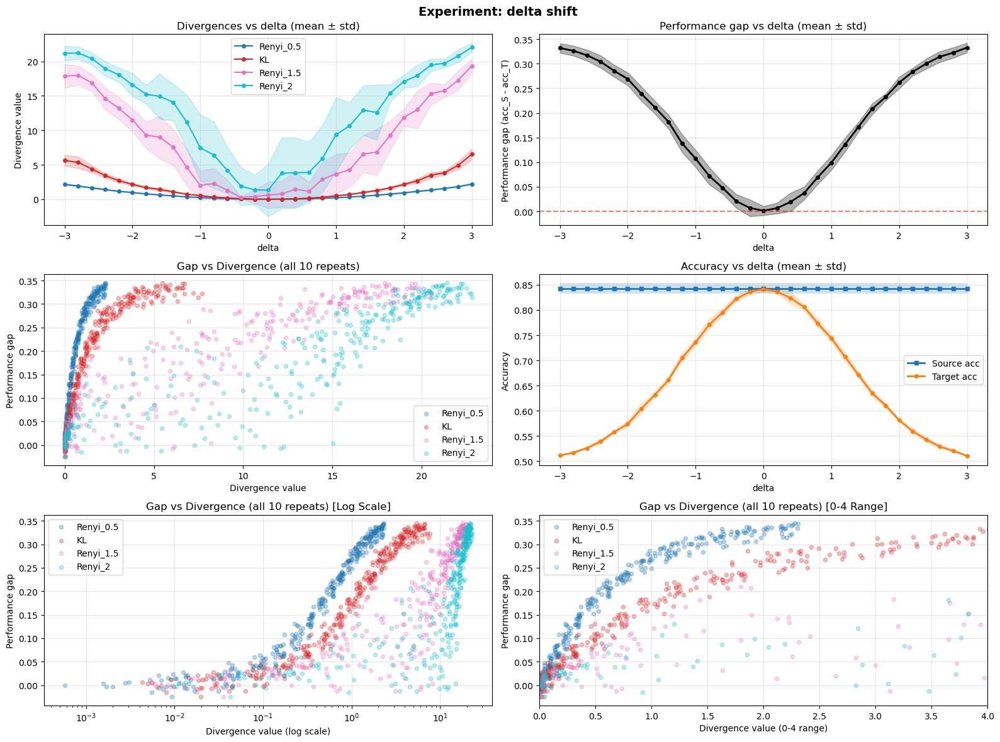


Aggregated results (first 10 rows):
           gap                  KL          
          mean       std      mean       std
param                                       
-3.0   0.33165  0.009563  5.627838  0.781215
-2.8   0.32615  0.010072  5.358692  0.833558
-2.6   0.31685  0.011267  4.409964  0.500892
-2.4   0.30405  0.012453  3.420737  0.347635
-2.2   0.28525  0.012221  2.703834  0.272657
-2.0   0.26895  0.013048  2.167372  0.184168
-1.8   0.23890  0.014479  1.697487  0.125049
-1.6   0.21130  0.012955  1.435514  0.226093
-1.4   0.18200  0.014283  1.076741  0.117104
-1.2   0.13825  0.018008  0.751107  0.048258

EXPERIMENT 2: Prior Probability Shift (10 repeats)


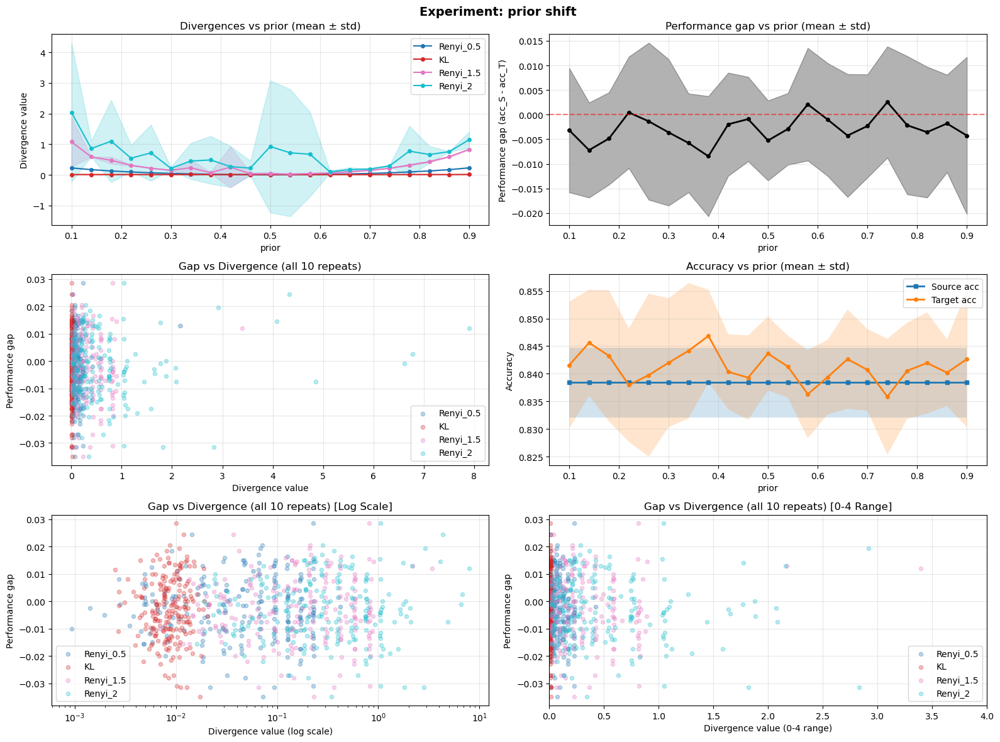


Aggregated results (first 10 rows):
           gap                  KL          
          mean       std      mean       std
param                                       
0.10  -0.00315  0.012632  0.009858  0.004349
0.14  -0.00720  0.009650  0.009470  0.003712
0.18  -0.00485  0.009375  0.008717  0.003337
0.22   0.00045  0.011332  0.009083  0.003042
0.26  -0.00135  0.015946  0.010153  0.005214
0.30  -0.00360  0.014877  0.008272  0.002304
0.34  -0.00575  0.010040  0.011222  0.005376
0.38  -0.00845  0.012210  0.008683  0.002835
0.42  -0.00195  0.010471  0.008690  0.002395
0.46  -0.00090  0.008576  0.009125  0.002443

EXPERIMENT 3: Variance Shift (10 repeats)


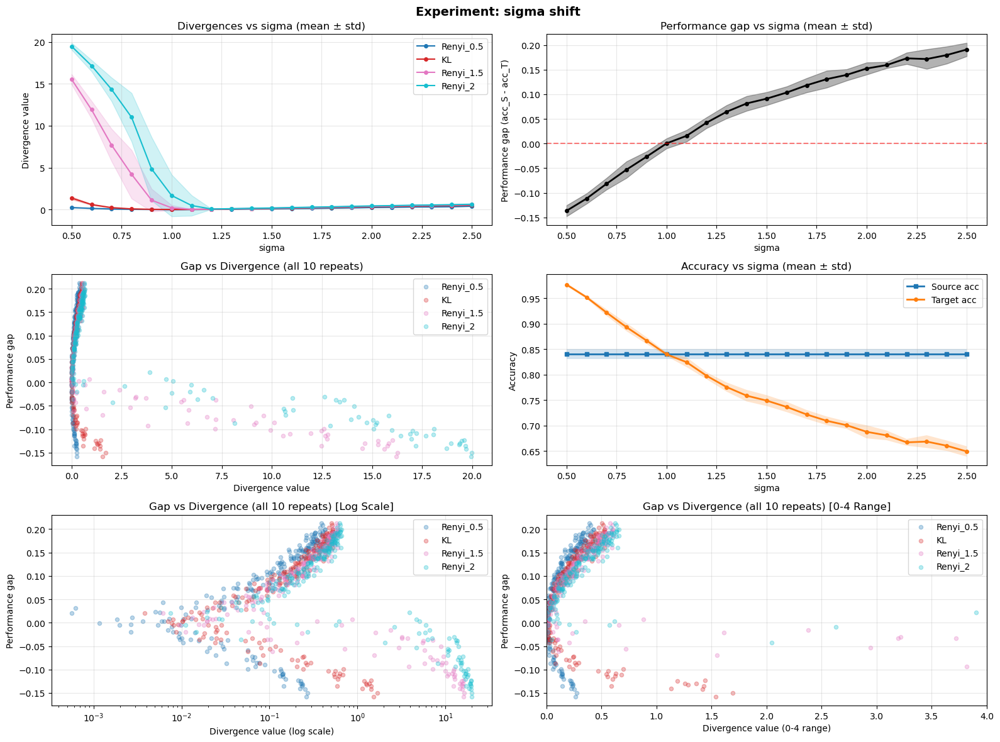


Aggregated results (first 10 rows):
           gap                  KL          
          mean       std      mean       std
param                                       
0.5   -0.13655  0.011204  1.374142  0.167911
0.6   -0.11170  0.010347  0.593481  0.067767
0.7   -0.08165  0.011740  0.227100  0.046542
0.8   -0.05290  0.016779  0.079636  0.019660
0.9   -0.02670  0.010727  0.023594  0.004987
1.0    0.00030  0.010144  0.010158  0.006702
1.1    0.01570  0.011779  0.016278  0.003839
1.2    0.04235  0.010965  0.037037  0.010299
1.3    0.06445  0.013399  0.066334  0.008852
1.4    0.08135  0.014902  0.101193  0.011588

SUMMARY: Correlation between divergences and performance gap

Delta shift:
  Renyi_0.5         : 0.9285
  KL                : 0.8785
  Renyi_1.5         : 0.9253
  Renyi_2           : 0.8996

Prior shift:
  Renyi_0.5         : 0.0988
  KL                : 0.0502
  Renyi_1.5         : 0.0863
  Renyi_2           : 0.0762

Variance shift:
  Renyi_0.5         : 0.9371
  KL      

In [2]:
import numpy as np
import pandas as pd
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from scipy.stats import norm, entropy, wasserstein_distance
from scipy.spatial.distance import cdist
import matplotlib.pyplot as plt
from scipy.stats import gaussian_kde

np.random.seed(42)

# ======================================================
# 1. Data generation
# ======================================================
def generate_1d_clf_data(n, mu0, mu1, sigma, prior=0.5):
    n1 = int(n * prior)
    n0 = n - n1
    X0 = np.random.normal(mu0, sigma, n0)
    X1 = np.random.normal(mu1, sigma, n1)
    X = np.concatenate([X0, X1])
    y = np.array([0]*n0 + [1]*n1)
    return X.reshape(-1,1), y

# ======================================================
# 2. Divergence functions
# ======================================================
def renyi_divergence_2d_clf(data_p, data_q, alpha=1.5, n_samples=2000, bw_method='scott'):
    """
    Monte Carlo estimation of Rényi divergence between two joint distributions P(X,Y) and Q(X,Y),
    where X is continuous (1D) and Y is binary {0,1}.
    
    Each dataset = array of shape (n, 2): columns = [x, y]
    """
    eps = 1e-12
    data_p = np.asarray(data_p)
    data_q = np.asarray(data_q)
    classes = np.unique(np.concatenate([data_p[:, 1], data_q[:, 1]]))
    
    # Estimate class priors p(y), q(y)
    p_y = {c: np.mean(data_p[:, 1] == c) for c in classes}
    q_y = {c: np.mean(data_q[:, 1] == c) for c in classes}
    
    total = 0.0
    for c in classes:
        x_p = data_p[data_p[:, 1] == c][:, 0]
        x_q = data_q[data_q[:, 1] == c][:, 0]
        if len(x_p) < 5 or len(x_q) < 5:
            continue
        
        kde_p = gaussian_kde(x_p, bw_method=bw_method)
        kde_q = gaussian_kde(x_q, bw_method=bw_method)
        
        # Monte Carlo samples from p(x|y=c)
        samples = kde_p.resample(n_samples)
        p_vals = np.clip(kde_p(samples), eps, None)
        q_vals = np.clip(kde_q(samples), eps, None)
        
        # Estimate conditional integral ∫ p(x|y)^α q(x|y)^{1-α} dx
        I_y = np.mean((q_vals / p_vals) ** (1 - alpha))
        
        # Contribution to the joint integral
        total += (p_y[c] ** alpha) * (q_y[c] ** (1 - alpha)) * I_y
    
    # Final joint Rényi divergence
    D_alpha = (1.0 / (alpha - 1.0)) * np.log(total + eps)
    return float(D_alpha)

def kl_divergence_2d_clf(data_p, data_q, n_samples=2000, bw_method='scott'):
    """
    KL divergence between two joint distributions with binary labels.
    KL(P || Q) = sum_y p(y) * KL(p(x|y) || q(x|y))
    """
    data_p = np.asarray(data_p)
    data_q = np.asarray(data_q)
    
    classes = [0, 1]
    D_total = 0.0
    eps = 1e-12
    
    for c in classes:
        x_p = data_p[data_p[:, 1] == c][:, 0]
        x_q = data_q[data_q[:, 1] == c][:, 0]
        if len(x_p) < 5 or len(x_q) < 5:
            continue
        
        kde_p = gaussian_kde(x_p, bw_method=bw_method)
        kde_q = gaussian_kde(x_q, bw_method=bw_method)
        
        samples = kde_p.resample(n_samples)
        p_vals = np.clip(kde_p(samples), eps, None)
        q_vals = np.clip(kde_q(samples), eps, None)
        
        D_class = np.mean(np.log(p_vals / q_vals))
        w_p = len(x_p) / len(data_p)
        D_total += w_p * D_class
    
    return float(D_total)

# def js_divergence_1d(x, y, bins=100):
#     """Jensen-Shannon divergence via histogram approximation."""
#     p_hist, edges = np.histogram(x, bins=bins, density=True)
#     q_hist, _ = np.histogram(y, bins=edges, density=True)
#     p_hist = p_hist / (p_hist.sum() + 1e-10)
#     q_hist = q_hist / (q_hist.sum() + 1e-10)
#     p_hist += 1e-10
#     q_hist += 1e-10
#     m = 0.5 * (p_hist + q_hist)
#     return 0.5 * (entropy(p_hist, m) + entropy(q_hist, m))

# def mmd_1d(x, y, sigma=1.0):
#     """Maximum Mean Discrepancy with RBF kernel."""
#     x = x.reshape(-1, 1)
#     y = y.reshape(-1, 1)
#     Kxx = np.exp(-cdist(x, x, 'sqeuclidean') / (2 * sigma**2))
#     Kyy = np.exp(-cdist(y, y, 'sqeuclidean') / (2 * sigma**2))
#     Kxy = np.exp(-cdist(x, y, 'sqeuclidean') / (2 * sigma**2))
#     mmd = np.mean(Kxx) + np.mean(Kyy) - 2 * np.mean(Kxy)
#     return float(max(0, mmd))

def compute_divergences_clf(X_S, y_S, X_T, y_T):
    """Compute all divergences for classification setup."""
    data_S = np.column_stack([X_S.flatten(), y_S.flatten()])
    data_T = np.column_stack([X_T.flatten(), y_T.flatten()])
    
    return {
        "Renyi_0.5": renyi_divergence_2d_clf(data_S, data_T, alpha=0.5, n_samples=3000),
        "KL": kl_divergence_2d_clf(data_S, data_T, n_samples=3000),
        "Renyi_1.5": renyi_divergence_2d_clf(data_S, data_T, alpha=1.5, n_samples=3000),
        "Renyi_2": renyi_divergence_2d_clf(data_S, data_T, alpha=2.0, n_samples=3000),
    }

# ======================================================
# 3. Experiments with different parameters
# ======================================================
def run_delta_shift_experiment(n_repeats=10):
    """Vary delta (mean shift) while keeping prior and variance fixed."""
    n = 2000
    mu0, mu1, sigma = 0.0, 2.0, 1.0
    prior = 0.5

    deltas = np.linspace(-3, 3, 31)
    results = []

    for repeat in range(n_repeats):
        # Generate new source data for each repeat
        X_S, y_S = generate_1d_clf_data(n, mu0, mu1, sigma, prior)
        clf = LogisticRegression().fit(X_S, y_S)
        acc_S = accuracy_score(y_S, clf.predict(X_S))

        for delta in deltas:
            X_T, y_T = generate_1d_clf_data(n, mu0+delta, mu1+delta, sigma, prior)
            acc_T = accuracy_score(y_T, clf.predict(X_T))
            gap = acc_S - acc_T

            Z_S = X_S.flatten()
            Z_T = X_T.flatten()
            divs = compute_divergences_clf(X_S, y_S, X_T, y_T)

            results.append({
                "repeat": repeat,
                "param": delta,
                "param_name": "delta",
                "acc_S": acc_S,
                "acc_T": acc_T,
                "gap": gap,
                **divs
            })

    return pd.DataFrame(results)

def run_prior_shift_experiment(n_repeats=10):
    """Vary target prior while keeping source prior, delta, and variance fixed."""
    n = 2000
    mu0, mu1, sigma = 0.0, 2.0, 1.0
    prior_S = 0.5

    priors_T = np.linspace(0.1, 0.9, 21)
    results = []

    for repeat in range(n_repeats):
        # Generate new source data for each repeat
        X_S, y_S = generate_1d_clf_data(n, mu0, mu1, sigma, prior_S)
        clf = LogisticRegression().fit(X_S, y_S)
        acc_S = accuracy_score(y_S, clf.predict(X_S))

        for prior_T in priors_T:
            X_T, y_T = generate_1d_clf_data(n, mu0, mu1, sigma, prior_T)
            acc_T = accuracy_score(y_T, clf.predict(X_T))
            gap = acc_S - acc_T

            Z_S = X_S.flatten()
            Z_T = X_T.flatten()
            divs = compute_divergences_clf(X_S, y_S, X_T, y_T)

            results.append({
                "repeat": repeat,
                "param": prior_T,
                "param_name": "prior",
                "acc_S": acc_S,
                "acc_T": acc_T,
                "gap": gap,
                **divs
            })

    return pd.DataFrame(results)

def run_variance_shift_experiment(n_repeats=10):
    """Vary target variance while keeping prior, delta, and source variance fixed."""
    n = 2000
    mu0, mu1, sigma_S = 0.0, 2.0, 1.0
    prior = 0.5

    sigmas_T = np.linspace(0.5, 2.5, 21)
    results = []

    for repeat in range(n_repeats):
        # Generate new source data for each repeat
        X_S, y_S = generate_1d_clf_data(n, mu0, mu1, sigma_S, prior)
        clf = LogisticRegression().fit(X_S, y_S)
        acc_S = accuracy_score(y_S, clf.predict(X_S))

        for sigma_T in sigmas_T:
            X_T, y_T = generate_1d_clf_data(n, mu0, mu1, sigma_T, prior)
            acc_T = accuracy_score(y_T, clf.predict(X_T))
            gap = acc_S - acc_T

            Z_S = X_S.flatten()
            Z_T = X_T.flatten()
            divs = compute_divergences_clf(X_S, y_S, X_T, y_T)

            results.append({
                "repeat": repeat,
                "param": sigma_T,
                "param_name": "sigma",
                "acc_S": acc_S,
                "acc_T": acc_T,
                "gap": gap,
                **divs
            })

    return pd.DataFrame(results)

# ======================================================
# 4. Visualization
# ======================================================
def plot_experiment_results(df, title_suffix=""):
    """Create comprehensive plots for an experiment with error bars."""
    param_name = df['param_name'].iloc[0]

    # Aggregate statistics across repeats (excluding string columns)
    numeric_cols = ['acc_S', 'acc_T', 'gap', 'Renyi_0.5', 'KL',
                    'Renyi_1.5', 'Renyi_2']
    
    df_agg = df.groupby('param')[numeric_cols].agg(['mean', 'std']).reset_index()

    fig, axes = plt.subplots(3, 2, figsize=(16, 12))

    div_measures = ["Renyi_0.5", "KL", "Renyi_1.5", "Renyi_2"]
    colors = plt.cm.tab10(np.linspace(0, 1, len(div_measures)))

    param_values = df_agg['param'].values

    # Plot 1: Divergence vs parameter (with error bars)
    ax = axes[0, 0]
    for div, color in zip(div_measures, colors):
        mean_vals = df_agg[div]['mean'].values
        std_vals = df_agg[div]['std'].values
        ax.plot(param_values, mean_vals, label=div, marker='o', markersize=4, color=color)
        ax.fill_between(param_values, mean_vals - std_vals, mean_vals + std_vals,
                        alpha=0.2, color=color)
    ax.set_xlabel(f'{param_name}')
    ax.set_ylabel('Divergence value')
    ax.set_title(f'Divergences vs {param_name} (mean ± std)')
    ax.legend()
    ax.grid(True, alpha=0.3)

    # Plot 2: Performance gap vs parameter (with error bars)
    ax = axes[0, 1]
    gap_mean = df_agg['gap']['mean'].values
    gap_std = df_agg['gap']['std'].values
    ax.plot(param_values, gap_mean, marker='o', markersize=4, color='black', linewidth=2)
    ax.fill_between(param_values, gap_mean - gap_std, gap_mean + gap_std,
                    alpha=0.3, color='black')
    ax.axhline(y=0, color='r', linestyle='--', alpha=0.5)
    ax.set_xlabel(f'{param_name}')
    ax.set_ylabel('Performance gap (acc_S - acc_T)')
    ax.set_title(f'Performance gap vs {param_name} (mean ± std)')
    ax.grid(True, alpha=0.3)

    # Plot 3: Divergence vs gap (scatter with all repeats)
    ax = axes[1, 0]
    for div, color in zip(div_measures, colors):
        ax.scatter(df[div], df['gap'], label=div, alpha=0.3, s=20, color=color)
    ax.set_xlabel('Divergence value')
    ax.set_ylabel('Performance gap')
    ax.set_title(f'Gap vs Divergence (all {df["repeat"].max()+1} repeats)')
    ax.legend()
    ax.grid(True, alpha=0.3)

    # Plot 4: Source vs Target accuracy (with error bars)
    ax = axes[1, 1]
    acc_s_mean = df_agg['acc_S']['mean'].values
    acc_s_std = df_agg['acc_S']['std'].values
    acc_t_mean = df_agg['acc_T']['mean'].values
    acc_t_std = df_agg['acc_T']['std'].values

    ax.plot(param_values, acc_s_mean, label='Source acc', marker='s', markersize=4, linewidth=2)
    ax.fill_between(param_values, acc_s_mean - acc_s_std, acc_s_mean + acc_s_std, alpha=0.2)
    ax.plot(param_values, acc_t_mean, label='Target acc', marker='o', markersize=4, linewidth=2)
    ax.fill_between(param_values, acc_t_mean - acc_t_std, acc_t_mean + acc_t_std, alpha=0.2)
    ax.set_xlabel(f'{param_name}')
    ax.set_ylabel('Accuracy')
    ax.set_title(f'Accuracy vs {param_name} (mean ± std)')
    ax.legend()
    ax.grid(True, alpha=0.3)

    
    # Plot 5: repeat plot 3 but with x axis in log scale
    ax = axes[2, 0]
    for div, color in zip(div_measures, colors):
        ax.scatter(df[div], df['gap'], label=div, alpha=0.3, s=20, color=color)
    ax.set_xlabel('Divergence value (log scale)')
    ax.set_xscale('log')
    ax.set_ylabel('Performance gap')
    ax.set_title(f'Gap vs Divergence (all {df["repeat"].max()+1} repeats) [Log Scale]')
    ax.legend()
    ax.grid(True, alpha=0.3)
    
    # Plot 6: repeat plot 3 but with x axis in 0-4 range
    ax = axes[2, 1]
    for div, color in zip(div_measures, colors):
        ax.scatter(df[div], df['gap'], label=div, alpha=0.3, s=20, color=color)
    ax.set_xlabel('Divergence value (0-4 range)')
    ax.set_xlim(0, 4)
    ax.set_ylabel('Performance gap')
    ax.set_title(f'Gap vs Divergence (all {df["repeat"].max()+1} repeats) [0-4 Range]')
    ax.legend()
    ax.grid(True, alpha=0.3)
    
    plt.suptitle(f'Experiment: {param_name} shift {title_suffix}', fontsize=14, fontweight='bold')
    plt.tight_layout()
    plt.show()

# ======================================================
# 5. Run all experiments
# ======================================================
n_repeats = 10  # Number of repeated measurements

print("="*80)
print(f"EXPERIMENT 1: Delta (Mean) Shift ({n_repeats} repeats)")
print("="*80)
df_delta = run_delta_shift_experiment(n_repeats=n_repeats)
plot_experiment_results(df_delta)
# Show aggregated statistics
df_delta_agg = df_delta.groupby('param')[['gap', 'KL']].agg(['mean', 'std'])
print("\nAggregated results (first 10 rows):")
print(df_delta_agg.head(10))

print("\n" + "="*80)
print(f"EXPERIMENT 2: Prior Probability Shift ({n_repeats} repeats)")
print("="*80)
df_prior = run_prior_shift_experiment(n_repeats=n_repeats)
plot_experiment_results(df_prior)
df_prior_agg = df_prior.groupby('param')[['gap', 'KL']].agg(['mean', 'std'])
print("\nAggregated results (first 10 rows):")
print(df_prior_agg.head(10))

print("\n" + "="*80)
print(f"EXPERIMENT 3: Variance Shift ({n_repeats} repeats)")
print("="*80)
df_variance = run_variance_shift_experiment(n_repeats=n_repeats)
plot_experiment_results(df_variance)
df_variance_agg = df_variance.groupby('param')[['gap', 'KL']].agg(['mean', 'std'])
print("\nAggregated results (first 10 rows):")
print(df_variance_agg.head(10))

# Summary comparison
print("\n" + "="*80)
print("SUMMARY: Correlation between divergences and performance gap")
print("="*80)
div_measures = ["Renyi_0.5", "KL", "Renyi_1.5", "Renyi_2"]
for exp_name, df in [("Delta shift", df_delta), ("Prior shift", df_prior), ("Variance shift", df_variance)]:
    print(f"\n{exp_name}:")
    for div in div_measures:
        corr = df[div].corr(df['gap'].abs())
        print(f"  {div:18s}: {corr:.4f}")

## Simple Regression


REGRESSION EXPERIMENTS - 2D EMPIRICAL DIVERGENCE ANALYSIS

EXPERIMENT 1: X Shift (Covariate Shift)
Repeat 1/10
Repeat 2/10
Repeat 3/10
Repeat 4/10
Repeat 5/10
Repeat 6/10
Repeat 7/10
Repeat 8/10
Repeat 9/10
Repeat 10/10


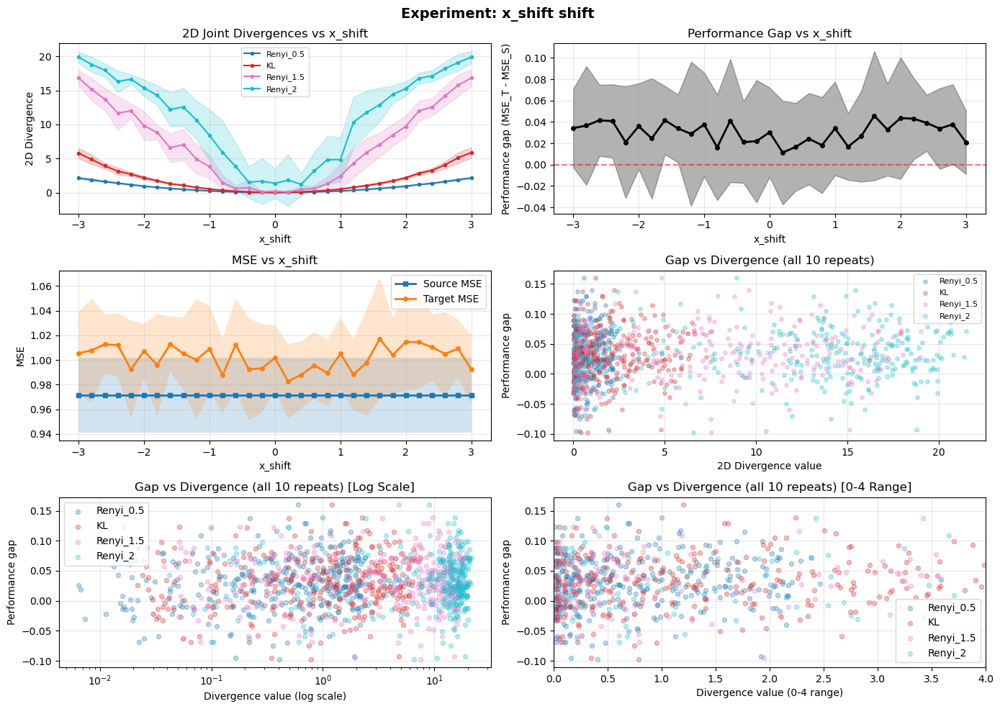


Sample results:
            gap        KL
param                    
-3.0   0.034213  5.778373
-2.8   0.036563  4.864903
-2.6   0.041506  3.918059
-2.4   0.040776  3.145694
-2.2   0.021042  2.698175
-2.0   0.035980  2.161874
-1.8   0.024542  1.749580
-1.6   0.041646  1.294183
-1.4   0.033892  1.073362
-1.2   0.028836  0.756629

EXPERIMENT 2: Noise Shift
Repeat 1/10
Repeat 2/10
Repeat 3/10
Repeat 4/10
Repeat 5/10
Repeat 6/10
Repeat 7/10
Repeat 8/10
Repeat 9/10
Repeat 10/10


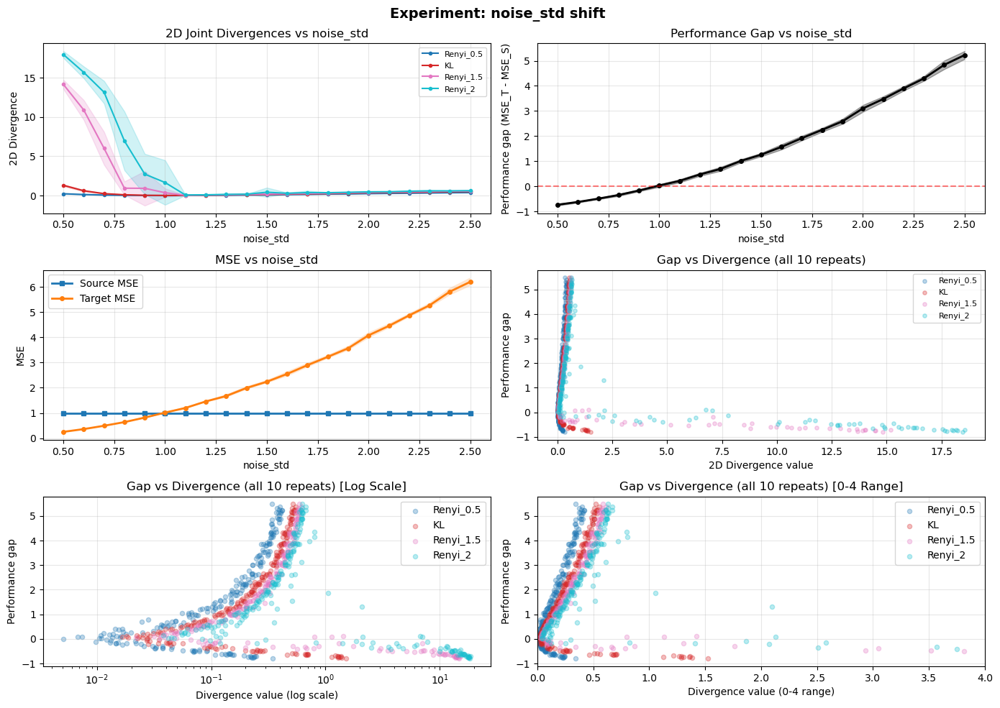


Sample results:
            gap        KL
param                    
0.5   -0.731751  1.311915
0.6   -0.621753  0.619383
0.7   -0.489729  0.251690
0.8   -0.344730  0.110078
0.9   -0.165177  0.040524
1.0    0.032752  0.024163
1.1    0.217280  0.032450
1.2    0.475921  0.058282
1.3    0.690235  0.076969
1.4    1.010202  0.121702

EXPERIMENT 3: Slope Shift (Concept Drift)
Repeat 1/10
Repeat 2/10
Repeat 3/10
Repeat 4/10
Repeat 5/10
Repeat 6/10
Repeat 7/10
Repeat 8/10
Repeat 9/10
Repeat 10/10


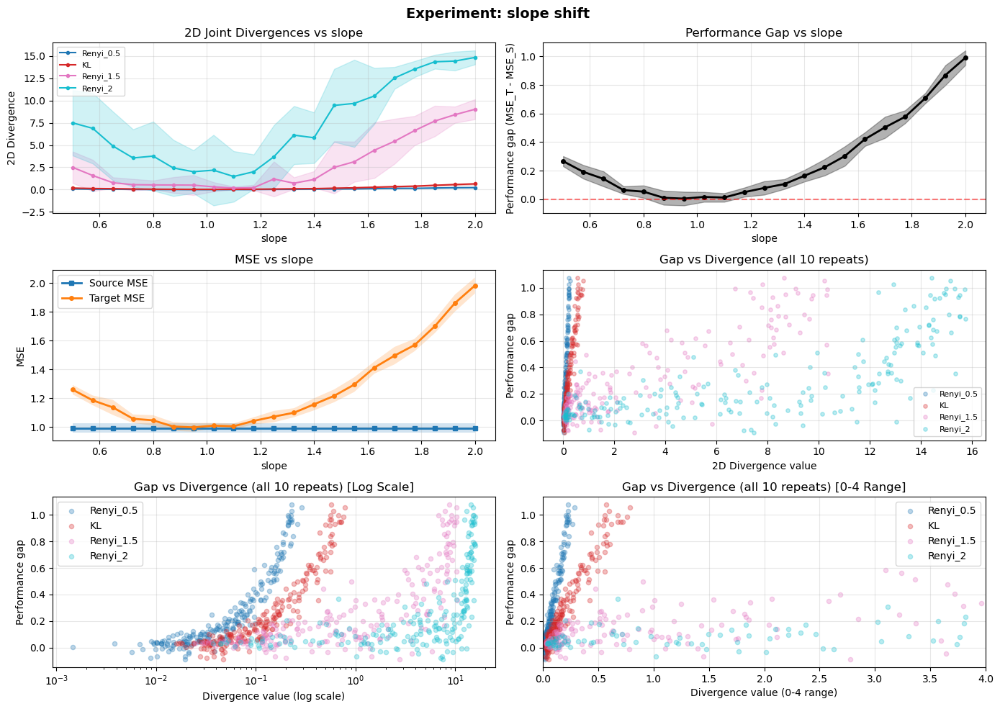


Sample results:
            gap        KL
param                    
0.500  0.266253  0.172504
0.575  0.191899  0.124284
0.650  0.143031  0.102415
0.725  0.064060  0.072787
0.800  0.053049  0.047748
0.875  0.010080  0.038766
0.950  0.004373  0.031259
1.025  0.016192  0.030875
1.100  0.011754  0.033559
1.175  0.049307  0.044712

EXPERIMENT 4: X Variance Shift
Repeat 1/10
Repeat 2/10
Repeat 3/10
Repeat 4/10
Repeat 5/10
Repeat 6/10
Repeat 7/10
Repeat 8/10
Repeat 9/10
Repeat 10/10


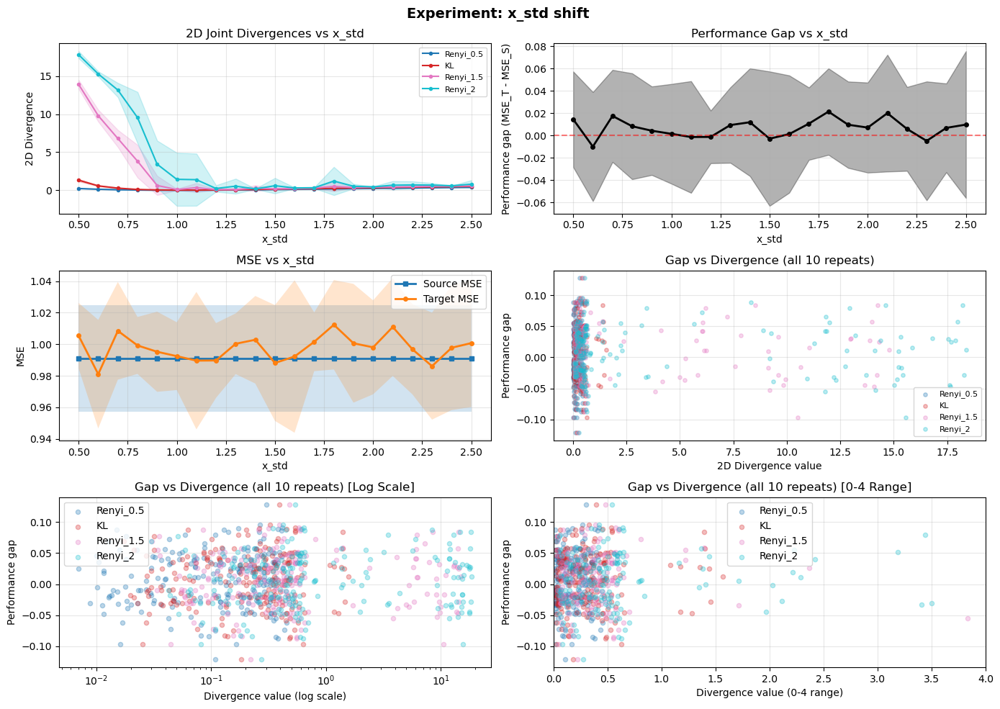


Sample results:
            gap        KL
param                    
0.5    0.014578  1.330978
0.6   -0.009828  0.583643
0.7    0.017633  0.286800
0.8    0.008375  0.109820
0.9    0.004377  0.050871
1.0    0.001585  0.026060
1.1   -0.001255  0.032145
1.2   -0.001152  0.050857
1.3    0.009444  0.074736
1.4    0.011980  0.110525

SUMMARY: Correlation between 2D divergences and performance gap

X shift:
  Renyi_0.5         : 0.0021
  KL                : 0.0001
  Renyi_1.5         : -0.0186
  Renyi_2           : -0.0300

Noise shift:
  Renyi_0.5         : 0.9357
  KL                : 0.3306
  Renyi_1.5         : -0.2684
  Renyi_2           : -0.3662

Slope shift:
  Renyi_0.5         : 0.9765
  KL                : 0.9700
  Renyi_1.5         : 0.8627
  Renyi_2           : 0.7753

X variance shift:
  Renyi_0.5         : 0.0940
  KL                : 0.0632
  Renyi_1.5         : 0.0302
  Renyi_2           : 0.0390


In [3]:
import numpy as np
import pandas as pd
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from scipy.stats import entropy, wasserstein_distance
from scipy.spatial.distance import cdist
from scipy.stats import gaussian_kde
import matplotlib.pyplot as plt

np.random.seed(42)

# ======================================================
# 1. Data generation
# ======================================================
def generate_regression_data(n, slope=1.0, intercept=0.0, noise_std=1.0, x_mean=0.0, x_std=1.0):
    """Generate regression data: y = slope * x + intercept + noise."""
    X = np.random.normal(x_mean, x_std, n)
    y = slope * X + intercept + np.random.normal(0, noise_std, n)
    return X.reshape(-1, 1), y

# ======================================================
# 2. Divergence functions using empirical distributions
# ======================================================
import numpy as np
from scipy.stats import gaussian_kde

def renyi_divergence_2d(data_p, data_q, alpha=1.5, n_samples=2000, bw_method='scott'):
    data_p = np.asarray(data_p).T
    data_q = np.asarray(data_q).T
    
    kde_p = gaussian_kde(data_p, bw_method=bw_method)
    kde_q = gaussian_kde(data_q, bw_method=bw_method)
    
    samples = kde_p.resample(n_samples)
    p_vals = np.clip(kde_p(samples), 1e-12, None)
    q_vals = np.clip(kde_q(samples), 1e-12, None)
    
    ratio = (p_vals ** (alpha - 1)) * (q_vals ** (1 - alpha))
    if ratio.size == 0:
        return np.nan
    
    D_alpha = (1.0 / (alpha - 1)) * np.log(np.mean(ratio))
    return float(D_alpha)

def kl_divergence_2d(data_p, data_q, n_samples=2000, bw_method='scott'):
    data_p = np.asarray(data_p).T
    data_q = np.asarray(data_q).T
    
    kde_p = gaussian_kde(data_p, bw_method=bw_method)
    kde_q = gaussian_kde(data_q, bw_method=bw_method)
    
    samples = kde_p.resample(n_samples)
    p_vals = np.clip(kde_p(samples), 1e-12, None)
    q_vals = np.clip(kde_q(samples), 1e-12, None)
    
    D_kl = np.mean(np.log(p_vals / q_vals))
    return float(D_kl)


def js_divergence_2d(data_p, data_q, bins=30):
    xy1 = data_p
    xy2 = data_q
    p_hist, x_edges, y_edges = np.histogram2d(xy1[:,0], xy1[:,1], bins=bins, density=True)
    q_hist, _, _ = np.histogram2d(xy2[:,0], xy2[:,1], bins=[x_edges, y_edges], density=True)
    
    p_hist = p_hist / (p_hist.sum() + 1e-10)
    q_hist = q_hist / (q_hist.sum() + 1e-10)
    
    p_hist += 1e-10
    q_hist += 1e-10
    
    m = 0.5 * (p_hist + q_hist)
    return 0.5 * (entropy(p_hist.flatten(), m.flatten()) + entropy(q_hist.flatten(), m.flatten()))

def mmd_2d(data_p, data_q, sigma=1.0):
    xy1 = data_p
    xy2 = data_q
    Kxx = np.exp(-cdist(xy1, xy1, 'sqeuclidean') / (2 * sigma**2))
    Kyy = np.exp(-cdist(xy2, xy2, 'sqeuclidean') / (2 * sigma**2))
    Kxy = np.exp(-cdist(xy1, xy2, 'sqeuclidean') / (2 * sigma**2))
    mmd = np.mean(Kxx) + np.mean(Kyy) - 2 * np.mean(Kxy)
    return float(max(0, mmd))

def wasserstein_2d(data_p, data_q, n_projections=100):
    xy1 = data_p
    xy2 = data_q
    distances = []

    for _ in range(n_projections):
        theta = np.random.uniform(0, 2 * np.pi)
        direction = np.array([np.cos(theta), np.sin(theta)])
        proj1 = xy1 @ direction
        proj2 = xy2 @ direction
        distances.append(wasserstein_distance(proj1, proj2))

    return float(np.mean(distances))

def compute_divergences_regression(X_S, y_S, X_T, y_T):
    data_S = np.column_stack([X_S.flatten(), y_S.flatten()])
    data_T = np.column_stack([X_T.flatten(), y_T.flatten()])
    
    return {
        "Renyi_0.5": renyi_divergence_2d(data_S, data_T, alpha=0.5, n_samples=3000),
        "KL": kl_divergence_2d(data_S, data_T, n_samples=3000),
        "Renyi_1.5": renyi_divergence_2d(data_S, data_T, alpha=1.5, n_samples=3000),
        "Renyi_2": renyi_divergence_2d(data_S, data_T, alpha=2.0, n_samples=3000),
        # "JS": js_divergence_2d(data_S, data_T, bins=30),
        # "MMD": mmd_2d(data_S, data_T, sigma=1.0),
        # "Wasserstein": wasserstein_2d(data_S, data_T, n_projections=100)
    }

# ======================================================
# 3. Regression experiments
# ======================================================
def run_regression_x_shift_experiment(n_repeats=10):
    n = 2000
    slope, intercept, noise_std = 1.0, 0.0, 1.0
    x_mean_S, x_std = 0.0, 1.0
    x_shifts = np.linspace(-3, 3, 31)
    results = []

    for repeat in range(n_repeats):
        print(f"Repeat {repeat+1}/{n_repeats}")
        X_S, y_S = generate_regression_data(n, slope, intercept, noise_std, x_mean_S, x_std)
        reg = LinearRegression().fit(X_S, y_S)
        mse_S = mean_squared_error(y_S, reg.predict(X_S))

        for x_shift in x_shifts:
            X_T, y_T = generate_regression_data(n, slope, intercept, noise_std, x_mean_S + x_shift, x_std)
            mse_T = mean_squared_error(y_T, reg.predict(X_T))
            gap = mse_T - mse_S
            divs = compute_divergences_regression(X_S, y_S, X_T, y_T)
            results.append({
                "repeat": repeat,
                "param": x_shift,
                "param_name": "x_shift",
                "mse_S": mse_S,
                "mse_T": mse_T,
                "gap": gap,
                **divs
            })

    return pd.DataFrame(results)

def run_regression_noise_shift_experiment(n_repeats=10):
    n = 2000
    slope, intercept = 1.0, 0.0
    x_mean, x_std = 0.0, 1.0
    noise_std_S = 1.0
    noise_stds_T = np.linspace(0.5, 2.5, 21)
    results = []

    for repeat in range(n_repeats):
        print(f"Repeat {repeat+1}/{n_repeats}")
        X_S, y_S = generate_regression_data(n, slope, intercept, noise_std_S, x_mean, x_std)
        reg = LinearRegression().fit(X_S, y_S)
        mse_S = mean_squared_error(y_S, reg.predict(X_S))

        for noise_std_T in noise_stds_T:
            X_T, y_T = generate_regression_data(n, slope, intercept, noise_std_T, x_mean, x_std)
            mse_T = mean_squared_error(y_T, reg.predict(X_T))
            gap = mse_T - mse_S
            divs = compute_divergences_regression(X_S, y_S, X_T, y_T)
            results.append({
                "repeat": repeat,
                "param": noise_std_T,
                "param_name": "noise_std",
                "mse_S": mse_S,
                "mse_T": mse_T,
                "gap": gap,
                **divs
            })

    return pd.DataFrame(results)

def run_regression_slope_shift_experiment(n_repeats=10):
    n = 2000
    slope_S, intercept, noise_std = 1.0, 0.0, 1.0
    x_mean, x_std = 0.0, 1.0
    slopes_T = np.linspace(0.5, 2.0, 21)
    results = []

    for repeat in range(n_repeats):
        print(f"Repeat {repeat+1}/{n_repeats}")
        X_S, y_S = generate_regression_data(n, slope_S, intercept, noise_std, x_mean, x_std)
        reg = LinearRegression().fit(X_S, y_S)
        mse_S = mean_squared_error(y_S, reg.predict(X_S))

        for slope_T in slopes_T:
            X_T, y_T = generate_regression_data(n, slope_T, intercept, noise_std, x_mean, x_std)
            mse_T = mean_squared_error(y_T, reg.predict(X_T))
            gap = mse_T - mse_S
            divs = compute_divergences_regression(X_S, y_S, X_T, y_T)
            results.append({
                "repeat": repeat,
                "param": slope_T,
                "param_name": "slope",
                "mse_S": mse_S,
                "mse_T": mse_T,
                "gap": gap,
                **divs
            })

    return pd.DataFrame(results)

def run_regression_x_variance_shift_experiment(n_repeats=10):
    n = 2000
    slope, intercept, noise_std = 1.0, 0.0, 1.0
    x_mean, x_std_S = 0.0, 1.0
    x_stds_T = np.linspace(0.5, 2.5, 21)
    results = []

    for repeat in range(n_repeats):
        print(f"Repeat {repeat+1}/{n_repeats}")
        X_S, y_S = generate_regression_data(n, slope, intercept, noise_std, x_mean, x_std_S)
        reg = LinearRegression().fit(X_S, y_S)
        mse_S = mean_squared_error(y_S, reg.predict(X_S))

        for x_std_T in x_stds_T:
            X_T, y_T = generate_regression_data(n, slope, intercept, noise_std, x_mean, x_std_T)
            mse_T = mean_squared_error(y_T, reg.predict(X_T))
            gap = mse_T - mse_S
            divs = compute_divergences_regression(X_S, y_S, X_T, y_T)
            results.append({
                "repeat": repeat,
                "param": x_std_T,
                "param_name": "x_std",
                "mse_S": mse_S,
                "mse_T": mse_T,
                "gap": gap,
                **divs
            })

    return pd.DataFrame(results)

# ======================================================
# 4. Visualization
# ======================================================
def plot_regression_results(df, title_suffix=""):
    param_name = df['param_name'].iloc[0]
    metric_cols = ['mse_S', 'mse_T', 'gap', 'Renyi_0.5', 'KL', 'Renyi_1.5', 'Renyi_2']
    df_agg = df.groupby('param')[metric_cols].agg(['mean', 'std']).reset_index()

    fig, axes = plt.subplots(3, 2, figsize=(14, 10))
    div_measures = ["Renyi_0.5", "KL", "Renyi_1.5", "Renyi_2"]
    colors = plt.cm.tab10(np.linspace(0, 1, len(div_measures)))
    param_values = df_agg['param'].values

    # Plot 1: 2D Divergence vs parameter
    ax = axes[0, 0]
    for div, color in zip(div_measures, colors):
        mean_vals = df_agg[div]['mean'].values
        std_vals = df_agg[div]['std'].values
        ax.plot(param_values, mean_vals, label=div, marker='o', markersize=3, color=color)
        ax.fill_between(param_values, mean_vals - std_vals, mean_vals + std_vals, alpha=0.2, color=color)
    ax.set_xlabel(f'{param_name}')
    ax.set_ylabel('2D Divergence')
    ax.set_title(f'2D Joint Divergences vs {param_name}')
    ax.legend(fontsize=8)
    ax.grid(True, alpha=0.3)

    # Plot 2: Performance gap vs parameter
    ax = axes[0, 1]
    gap_mean = df_agg['gap']['mean'].values
    gap_std = df_agg['gap']['std'].values
    ax.plot(param_values, gap_mean, marker='o', markersize=4, color='black', linewidth=2)
    ax.fill_between(param_values, gap_mean - gap_std, gap_mean + gap_std, alpha=0.3, color='black')
    ax.axhline(y=0, color='r', linestyle='--', alpha=0.5)
    ax.set_xlabel(f'{param_name}')
    ax.set_ylabel('Performance gap (MSE_T - MSE_S)')
    ax.set_title(f'Performance Gap vs {param_name}')
    ax.grid(True, alpha=0.3)

    # Plot 3: Source vs Target MSE
    ax = axes[1, 0]
    mse_s_mean = df_agg['mse_S']['mean'].values
    mse_s_std = df_agg['mse_S']['std'].values
    mse_t_mean = df_agg['mse_T']['mean'].values
    mse_t_std = df_agg['mse_T']['std'].values
    ax.plot(param_values, mse_s_mean, label='Source MSE', marker='s', markersize=4, linewidth=2)
    ax.fill_between(param_values, mse_s_mean - mse_s_std, mse_s_mean + mse_s_std, alpha=0.2)
    ax.plot(param_values, mse_t_mean, label='Target MSE', marker='o', markersize=4, linewidth=2)
    ax.fill_between(param_values, mse_t_mean - mse_t_std, mse_t_mean + mse_t_std, alpha=0.2)
    ax.set_xlabel(f'{param_name}')
    ax.set_ylabel('MSE')
    ax.set_title(f'MSE vs {param_name}')
    ax.legend()
    ax.grid(True, alpha=0.3)

    # Plot 4: Divergence vs gap scatter (all repeats)
    ax = axes[1, 1]
    for div, color in zip(div_measures, colors):
        ax.scatter(df[div], df['gap'], label=div, alpha=0.3, s=15, color=color)
    ax.set_xlabel('2D Divergence value')
    ax.set_ylabel('Performance gap')
    ax.set_title(f'Gap vs Divergence (all {df["repeat"].max()+1} repeats)')
    ax.legend(fontsize=8)
    ax.grid(True, alpha=0.3)
    
    
    # Plot 5: repeat plot 3 but with x axis in log scale
    ax = axes[2, 0]
    for div, color in zip(div_measures, colors):
        ax.scatter(df[div], df['gap'], label=div, alpha=0.3, s=20, color=color)
    ax.set_xlabel('Divergence value (log scale)')
    ax.set_xscale('log')
    ax.set_ylabel('Performance gap')
    ax.set_title(f'Gap vs Divergence (all {df["repeat"].max()+1} repeats) [Log Scale]')
    ax.legend()
    ax.grid(True, alpha=0.3)
    
    # Plot 6: repeat plot 3 but with x axis in 0-4 range
    ax = axes[2, 1]
    for div, color in zip(div_measures, colors):
        ax.scatter(df[div], df['gap'], label=div, alpha=0.3, s=20, color=color)
    ax.set_xlabel('Divergence value (0-4 range)')
    ax.set_xlim(0, 4)
    ax.set_ylabel('Performance gap')
    ax.set_title(f'Gap vs Divergence (all {df["repeat"].max()+1} repeats) [0-4 Range]')
    ax.legend()
    ax.grid(True, alpha=0.3)
    
    plt.suptitle(f'Experiment: {param_name} shift {title_suffix}', fontsize=14, fontweight='bold')
    plt.tight_layout()
    plt.show()


# ======================================================
# 5. Run all regression experiments
# ======================================================
n_repeats = 10

print("="*80)
print("REGRESSION EXPERIMENTS - 2D EMPIRICAL DIVERGENCE ANALYSIS")
print("="*80)

print("\n" + "="*80)
print("EXPERIMENT 1: X Shift (Covariate Shift)")
print("="*80)
df_reg_x = run_regression_x_shift_experiment(n_repeats=n_repeats)
plot_regression_results(df_reg_x)
print("\nSample results:")
print(df_reg_x.groupby('param')[['gap', 'KL']].mean().head(10))

print("\n" + "="*80)
print("EXPERIMENT 2: Noise Shift")
print("="*80)
df_reg_noise = run_regression_noise_shift_experiment(n_repeats=n_repeats)
plot_regression_results(df_reg_noise)
print("\nSample results:")
print(df_reg_noise.groupby('param')[['gap', 'KL']].mean().head(10))

print("\n" + "="*80)
print("EXPERIMENT 3: Slope Shift (Concept Drift)")
print("="*80)
df_reg_slope = run_regression_slope_shift_experiment(n_repeats=n_repeats)
plot_regression_results(df_reg_slope)
print("\nSample results:")
print(df_reg_slope.groupby('param')[['gap', 'KL']].mean().head(10))

print("\n" + "="*80)
print("EXPERIMENT 4: X Variance Shift")
print("="*80)
df_reg_x_var = run_regression_x_variance_shift_experiment(n_repeats=n_repeats)
plot_regression_results(df_reg_x_var)
print("\nSample results:")
print(df_reg_x_var.groupby('param')[['gap', 'KL']].mean().head(10))

# Summary comparison
print("\nSUMMARY: Correlation between 2D divergences and performance gap")
div_measures = ["Renyi_0.5", "KL", "Renyi_1.5", "Renyi_2"]

for exp_name, df in [("X shift", df_reg_x),
                      ("Noise shift", df_reg_noise),
                      ("Slope shift", df_reg_slope),
                      ("X variance shift", df_reg_x_var)]:
    print(f"\n{exp_name}:")
    for div in div_measures:
        corr = df[div].corr(df['gap'].abs())
        print(f"  {div:18s}: {corr:.4f}")


## Simple Regression - General Shift

In [3]:
import numpy as np
import pandas as pd
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from scipy.stats import entropy, wasserstein_distance
from scipy.spatial.distance import cdist
from scipy.stats import gaussian_kde
import matplotlib.pyplot as plt
from itertools import product
import seaborn as sns

np.random.seed(42)

# ======================================================
# 1. Data generation
# ======================================================
def generate_regression_data(n, slope=1.0, intercept=0.0, noise_std=1.0, x_mean=0.0, x_std=1.0):
    """Generate regression data: y = slope * x + intercept + noise."""
    X = np.random.normal(x_mean, x_std, n)
    y = slope * X + intercept + np.random.normal(0, noise_std, n)
    return X.reshape(-1, 1), y

# ======================================================
# 2. Divergence functions
# ======================================================
def renyi_divergence_2d(data_p, data_q, alpha=1.5, n_samples=2000, bw_method='scott'):
    data_p = np.asarray(data_p).T
    data_q = np.asarray(data_q).T
    
    kde_p = gaussian_kde(data_p, bw_method=bw_method)
    kde_q = gaussian_kde(data_q, bw_method=bw_method)
    
    samples = kde_p.resample(n_samples)
    p_vals = np.clip(kde_p(samples), 1e-12, None)
    q_vals = np.clip(kde_q(samples), 1e-12, None)
    
    ratio = (p_vals ** (alpha - 1)) * (q_vals ** (1 - alpha))
    if ratio.size == 0:
        return np.nan
    
    D_alpha = (1.0 / (alpha - 1)) * np.log(np.mean(ratio))
    return float(D_alpha)

def kl_divergence_2d(data_p, data_q, n_samples=2000, bw_method='scott'):
    data_p = np.asarray(data_p).T
    data_q = np.asarray(data_q).T
    
    kde_p = gaussian_kde(data_p, bw_method=bw_method)
    kde_q = gaussian_kde(data_q, bw_method=bw_method)
    
    samples = kde_p.resample(n_samples)
    p_vals = np.clip(kde_p(samples), 1e-12, None)
    q_vals = np.clip(kde_q(samples), 1e-12, None)
    
    D_kl = np.mean(np.log(p_vals / q_vals))
    return float(D_kl)

def compute_divergences_regression(X_S, y_S, X_T, y_T):
    data_S = np.column_stack([X_S.flatten(), y_S.flatten()])
    data_T = np.column_stack([X_T.flatten(), y_T.flatten()])
    
    return {
        "Renyi_0.5": renyi_divergence_2d(data_S, data_T, alpha=0.5, n_samples=3000),
        "KL": kl_divergence_2d(data_S, data_T, n_samples=3000),
        "Renyi_1.5": renyi_divergence_2d(data_S, data_T, alpha=1.5, n_samples=3000),
        "Renyi_2": renyi_divergence_2d(data_S, data_T, alpha=2.0, n_samples=3000),
    }

# ======================================================
# 3. General domain shift grid experiment
# ======================================================
def run_general_domain_shift_grid(n_repeats=10, grid_resolution='fine'):
    """
    Run grid experiment where multiple parameters can shift simultaneously.
    
    Parameters:
    -----------
    n_repeats : int
        Number of random repeats for each grid point
    grid_resolution : str
        'coarse' for faster results, 'medium' for more detail, 'fine' for comprehensive
    """
    n = 1500  # Reduced sample size for faster computation
    
    # Source distribution (fixed)
    slope_S = 1.0
    intercept_S = 0.0
    noise_std_S = 1.0
    x_mean_S = 0.0
    x_std_S = 1.0
    
    # Define grid for target distribution
    if grid_resolution == 'coarse':
        slope_T_vals = [0.5, 1.0, 1.5]
        intercept_T_vals = [0.0, 1.0]
        noise_std_T_vals = [0.7, 1.0, 1.5]
        x_mean_T_vals = [-1.0, 0.0, 1.0]
        x_std_T_vals = [0.7, 1.0, 1.5]
    elif grid_resolution == 'medium':
        slope_T_vals = [0.5, 0.75, 1.0, 1.25, 1.5]
        intercept_T_vals = [-0.5, 0.0, 0.5, 1.0]
        noise_std_T_vals = [0.5, 0.75, 1.0, 1.25, 1.5]
        x_mean_T_vals = [-1.5, -0.5, 0.0, 0.5, 1.5]
        x_std_T_vals = [0.5, 0.75, 1.0, 1.25, 1.5]
    else:  # fine
        slope_T_vals = np.linspace(0.5, 1.5, 5)
        intercept_T_vals = np.linspace(-1.0, 1.0, 5)
        noise_std_T_vals = np.linspace(0.5, 1.5, 5)
        x_mean_T_vals = np.linspace(-2.0, 2.0, 5)
        x_std_T_vals = np.linspace(0.5, 1.5, 5)
    
    # Create grid
    grid = list(product(slope_T_vals, intercept_T_vals, noise_std_T_vals, 
                       x_mean_T_vals, x_std_T_vals))
    
    total_configs = len(grid)
    print(f"Total configurations: {total_configs}")
    print(f"Total experiments: {total_configs * n_repeats}")
    
    results = []
    
    for config_idx, (slope_T, intercept_T, noise_std_T, x_mean_T, x_std_T) in enumerate(grid):
        if config_idx % 10 == 0:
            print(f"Processing configuration {config_idx+1}/{total_configs}")
        
        # Calculate shift magnitudes
        slope_shift = abs(slope_T - slope_S)
        intercept_shift = abs(intercept_T - intercept_S)
        noise_shift = abs(noise_std_T - noise_std_S)
        x_mean_shift = abs(x_mean_T - x_mean_S)
        x_std_shift = abs(x_std_T - x_std_S)
        total_shift = slope_shift + intercept_shift + noise_shift + x_mean_shift + x_std_shift
        
        for repeat in range(n_repeats):
            # Generate source data
            X_S, y_S = generate_regression_data(n, slope_S, intercept_S, noise_std_S, 
                                                x_mean_S, x_std_S)
            
            # Train model on source
            reg = LinearRegression().fit(X_S, y_S)
            mse_S = mean_squared_error(y_S, reg.predict(X_S))
            
            # Generate target data
            X_T, y_T = generate_regression_data(n, slope_T, intercept_T, noise_std_T, 
                                                x_mean_T, x_std_T)
            
            # Evaluate on target
            mse_T = mean_squared_error(y_T, reg.predict(X_T))
            gap = mse_T - mse_S
            
            # Compute divergences
            divs = compute_divergences_regression(X_S, y_S, X_T, y_T)
            
            results.append({
                "repeat": repeat,
                "config_idx": config_idx,
                "slope_T": slope_T,
                "intercept_T": intercept_T,
                "noise_std_T": noise_std_T,
                "x_mean_T": x_mean_T,
                "x_std_T": x_std_T,
                "slope_shift": slope_shift,
                "intercept_shift": intercept_shift,
                "noise_shift": noise_shift,
                "x_mean_shift": x_mean_shift,
                "x_std_shift": x_std_shift,
                "total_shift": total_shift,
                "mse_S": mse_S,
                "mse_T": mse_T,
                "gap": gap,
                "gap_abs": abs(gap),
                **divs
            })
    
    return pd.DataFrame(results)


print("="*80)
print("GENERAL DOMAIN SHIFT GRID EXPERIMENT")
print("="*80)


df_grid = run_general_domain_shift_grid(n_repeats=10, grid_resolution='medium')

# Save results
df_grid.to_csv('general_domain_shift_results.csv', index=False)
print("\nResults saved to 'general_domain_shift_results.csv'")

print("\n" + "="*80)
print("EXPERIMENT COMPLETE")
print("="*80)

GENERAL DOMAIN SHIFT GRID EXPERIMENT
Total configurations: 2500
Total experiments: 25000
Processing configuration 1/2500
Processing configuration 11/2500
Processing configuration 21/2500
Processing configuration 31/2500
Processing configuration 41/2500
Processing configuration 51/2500
Processing configuration 61/2500
Processing configuration 71/2500
Processing configuration 81/2500
Processing configuration 91/2500
Processing configuration 101/2500
Processing configuration 111/2500
Processing configuration 121/2500
Processing configuration 131/2500
Processing configuration 141/2500
Processing configuration 151/2500
Processing configuration 161/2500
Processing configuration 171/2500
Processing configuration 181/2500
Processing configuration 191/2500
Processing configuration 201/2500
Processing configuration 211/2500
Processing configuration 221/2500
Processing configuration 231/2500
Processing configuration 241/2500
Processing configuration 251/2500
Processing configuration 261/2500
Proc

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.



CORRELATION ANALYSIS: Divergence vs Performance Gap (signed)

Renyi_0.5:
  Pearson:  0.1070
  Spearman: 0.0365
  Kendall:  0.0287

KL:
  Pearson:  -0.1483
  Spearman: -0.2496
  Kendall:  -0.1599

Renyi_1.5:
  Pearson:  -0.3648
  Spearman: -0.3901
  Kendall:  -0.2615

Renyi_2:
  Pearson:  -0.3854
  Spearman: -0.3992
  Kendall:  -0.2701


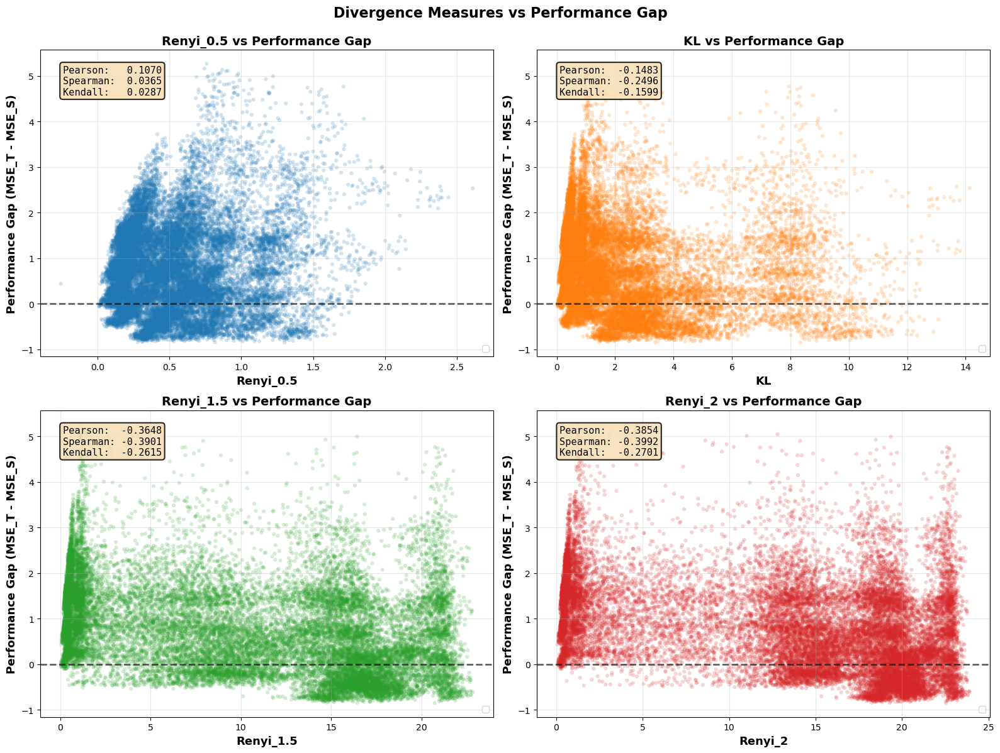

In [6]:
from scipy.stats import spearmanr, kendalltau

def plot_grid_results_corr(df):
    """
    Create separate correlation plots for each divergence measure vs performance gap (signed).
    
    Parameters:
    -----------
    df : DataFrame with columns 'Renyi_0.5', 'KL', 'Renyi_1.5', 'Renyi_2', 'gap', etc.
    """
    
    div_measures = ["Renyi_0.5", "KL", "Renyi_1.5", "Renyi_2"]
    colors = {'Renyi_0.5': '#1f77b4', 'KL': '#ff7f0e', 'Renyi_1.5': '#2ca02c', 'Renyi_2': '#d62728'}
    
    fig, axes = plt.subplots(2, 2, figsize=(16, 12))
    axes = axes.flatten()
    
    print("\n" + "="*80)
    print("CORRELATION ANALYSIS: Divergence vs Performance Gap (signed)")
    print("="*80)
    
    for idx, div in enumerate(div_measures):
        ax = axes[idx]
        color = colors[div]
        
        # Scatter plot
        ax.scatter(df[div], df['gap'], alpha=0.2, s=20, color=color, edgecolors='none')
        
        # Add horizontal line at gap=0
        ax.axhline(y=0, color='black', linestyle='--', linewidth=2, alpha=0.6)
    
        # Calculate correlations
        pearson_corr = df[div].corr(df['gap'])
        spearman_corr = spearmanr(df[div].dropna(), df['gap'].dropna())[0]
        kendall_corr = kendalltau(df[div].dropna(), df['gap'].dropna())[0]
        
        # Add correlation text box
        text_str = f'Pearson:  {pearson_corr:>7.4f}\nSpearman: {spearman_corr:>7.4f}\nKendall:  {kendall_corr:>7.4f}'
        ax.text(0.05, 0.95, text_str, 
                transform=ax.transAxes, fontsize=11, verticalalignment='top',
                family='monospace',
                bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.85, edgecolor='black', linewidth=1.5))
        
        ax.set_xlabel(f'{div}', fontsize=13, fontweight='bold')
        ax.set_ylabel('Performance Gap (MSE_T - MSE_S)', fontsize=13, fontweight='bold')
        ax.set_title(f'{div} vs Performance Gap', fontsize=14, fontweight='bold')
        ax.grid(True, alpha=0.3)
        ax.legend(fontsize=10, loc='lower right')
        
        # Print to console
        print(f"\n{div}:")
        print(f"  Pearson:  {pearson_corr:.4f}")
        print(f"  Spearman: {spearman_corr:.4f}")
        print(f"  Kendall:  {kendall_corr:.4f}")
    
    plt.suptitle('Divergence Measures vs Performance Gap', 
                fontsize=16, fontweight='bold', y=0.995)
    plt.tight_layout()
    plt.show()
    
    print("\n" + "="*80)

# Usage:
plot_grid_results_corr(df_grid)

/var/folders/1w/nb8zzzyd2b19zfmmnsf651j00000gn/T/ipykernel_21925/3304128879.py:265: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


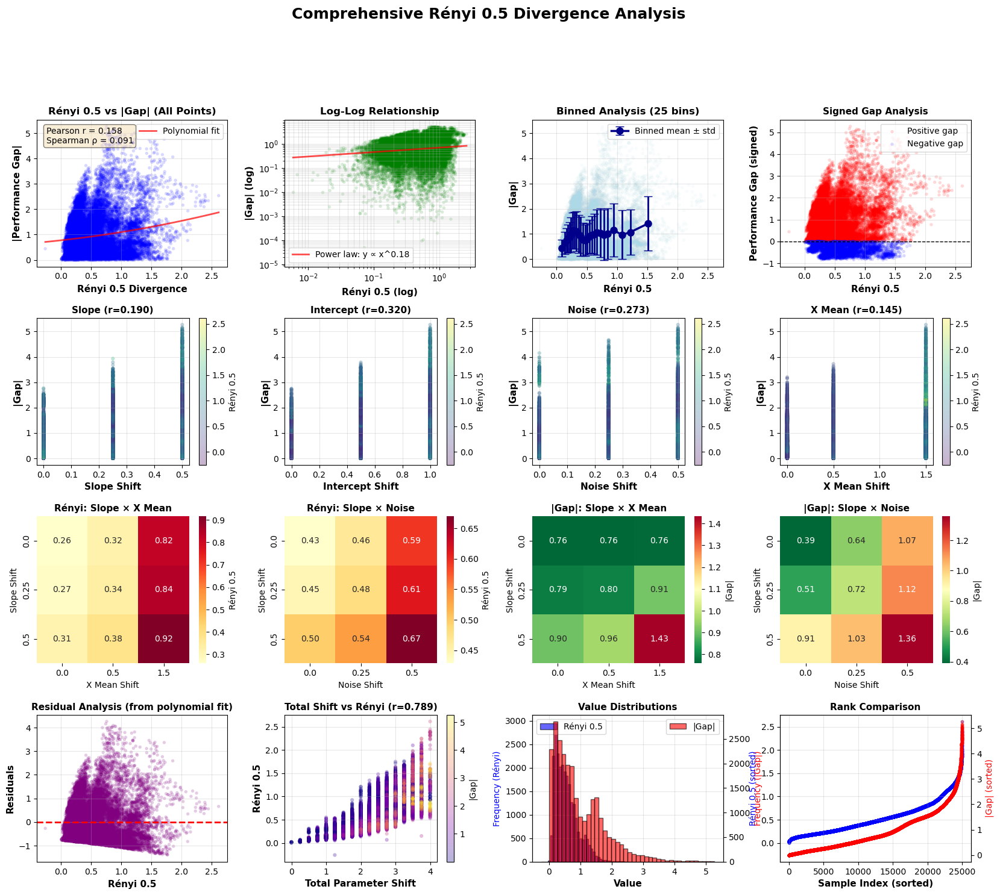


RÉNYI 0.5 DIVERGENCE - DETAILED STATISTICS

Total experiments: 25000
Unique configurations: 2500

--- Rényi 0.5 Statistics ---
Mean: 0.5452
Median: 0.4704
Std: 0.3581
Min: -0.2577
Max: 2.6125
25th percentile: 0.2562
75th percentile: 0.7371

--- Performance Gap Statistics ---
Mean |gap|: 0.9438
Median |gap|: 0.7054
Std |gap|: 0.8013
Min gap: -0.8498
Max gap: 5.2684

--- Correlation Analysis ---
Pearson correlation (Rényi 0.5 vs |gap|): 0.1577
Spearman correlation (Rényi 0.5 vs |gap|): 0.0908
Kendall tau (Rényi 0.5 vs |gap|): 0.0619

--- Shift Component Correlations with Rényi 0.5 ---
slope_shift         : 0.0815
intercept_shift     : 0.2372
noise_shift         : 0.1900
x_mean_shift        : 0.7213
x_std_shift         : 0.2047

--- Shift Component Correlations with |Gap| ---
slope_shift         : 0.1905
intercept_shift     : 0.3204
noise_shift         : 0.2734
x_mean_shift        : 0.1449
x_std_shift         : 0.0149

--- Top 10 Configurations by Rényi 0.5 ---
            Renyi_0.5   ga

In [7]:
# ======================================================
# Comprehensive Rényi 0.5 Analysis using existing df_grid
# ======================================================

def plot_renyi_comprehensive_analysis(df):
    """
    Create comprehensive analysis plots for Rényi 0.5.
    
    Parameters:
    -----------
    df : DataFrame with columns including 'Renyi_0.5', 'gap', 'gap_abs', 
         shift components, etc.
    """
    
    # Calculate aggregated data
    df_agg = df.groupby('config_idx').agg({
        'Renyi_0.5': 'mean',
        'gap_abs': 'mean',
        'gap': 'mean',
        'slope_shift': 'first',
        'intercept_shift': 'first',
        'noise_shift': 'first',
        'x_mean_shift': 'first',
        'x_std_shift': 'first',
        'total_shift': 'first',
        'slope_T': 'first',
        'intercept_T': 'first',
        'noise_std_T': 'first',
        'x_mean_T': 'first',
        'x_std_T': 'first'
    }).reset_index()
    
    fig = plt.figure(figsize=(20, 16))
    gs = fig.add_gridspec(4, 4, hspace=0.35, wspace=0.3)
    
    # ===== ROW 1: Basic Relationships =====
    
    # Plot 1: Rényi 0.5 vs |Gap| - Main relationship
    ax1 = fig.add_subplot(gs[0, 0])
    ax1.scatter(df['Renyi_0.5'], df['gap_abs'], alpha=0.15, s=15, c='blue', edgecolors='none')
    ax1.set_xlabel('Rényi 0.5 Divergence', fontsize=11, fontweight='bold')
    ax1.set_ylabel('|Performance Gap|', fontsize=11, fontweight='bold')
    
    # Add trend line
    valid_mask = df['Renyi_0.5'].notna() & df['gap_abs'].notna()
    if valid_mask.sum() > 3:
        z = np.polyfit(df.loc[valid_mask, 'Renyi_0.5'], df.loc[valid_mask, 'gap_abs'], 2)
        p = np.poly1d(z)
        x_trend = np.linspace(df['Renyi_0.5'].min(), df['Renyi_0.5'].max(), 100)
        ax1.plot(x_trend, p(x_trend), "r-", linewidth=2, alpha=0.7, label='Polynomial fit')
    
    corr_p = df['Renyi_0.5'].corr(df['gap_abs'])
    corr_s = spearmanr(df['Renyi_0.5'].dropna(), df['gap_abs'].dropna())[0]
    ax1.text(0.05, 0.95, f'Pearson r = {corr_p:.3f}\nSpearman ρ = {corr_s:.3f}', 
             transform=ax1.transAxes, fontsize=10, verticalalignment='top',
             bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))
    ax1.set_title('Rényi 0.5 vs |Gap| (All Points)', fontsize=12, fontweight='bold')
    ax1.legend()
    ax1.grid(True, alpha=0.3)
    
    # Plot 2: Log-Log relationship
    ax2 = fig.add_subplot(gs[0, 1])
    mask = (df['Renyi_0.5'] > 0) & (df['gap_abs'] > 0)
    ax2.scatter(df.loc[mask, 'Renyi_0.5'], df.loc[mask, 'gap_abs'], 
               alpha=0.15, s=15, c='green', edgecolors='none')
    ax2.set_xscale('log')
    ax2.set_yscale('log')
    ax2.set_xlabel('Rényi 0.5 (log)', fontsize=11, fontweight='bold')
    ax2.set_ylabel('|Gap| (log)', fontsize=11, fontweight='bold')
    
    # Log-log linear fit
    if mask.sum() > 3:
        log_x = np.log(df.loc[mask, 'Renyi_0.5'])
        log_y = np.log(df.loc[mask, 'gap_abs'])
        z_log = np.polyfit(log_x, log_y, 1)
        p_log = np.poly1d(z_log)
        x_log = np.linspace(log_x.min(), log_x.max(), 100)
        ax2.plot(np.exp(x_log), np.exp(p_log(x_log)), "r-", linewidth=2, alpha=0.7,
                label=f'Power law: y ∝ x^{z_log[0]:.2f}')
        ax2.legend()
    
    ax2.set_title('Log-Log Relationship', fontsize=12, fontweight='bold')
    ax2.grid(True, alpha=0.3, which='both')
    
    # Plot 3: Binned analysis
    ax3 = fig.add_subplot(gs[0, 2])
    df_sorted = df.sort_values('Renyi_0.5')
    n_bins = 25
    bin_size = max(len(df_sorted) // n_bins, 1)
    bins = [df_sorted.iloc[i:i+bin_size] for i in range(0, len(df_sorted), bin_size) if i+bin_size <= len(df_sorted)]
    
    if len(bins) > 0:
        bin_centers = [b['Renyi_0.5'].mean() for b in bins]
        bin_gaps = [b['gap_abs'].mean() for b in bins]
        bin_stds = [b['gap_abs'].std() for b in bins]
        
        ax3.scatter(df['Renyi_0.5'], df['gap_abs'], alpha=0.05, s=10, c='lightblue')
        ax3.errorbar(bin_centers, bin_gaps, yerr=bin_stds, fmt='o-', 
                    color='darkblue', linewidth=2.5, markersize=8, capsize=5, 
                    label='Binned mean ± std', elinewidth=2)
        ax3.legend()
    
    ax3.set_xlabel('Rényi 0.5', fontsize=11, fontweight='bold')
    ax3.set_ylabel('|Gap|', fontsize=11, fontweight='bold')
    ax3.set_title(f'Binned Analysis ({len(bins)} bins)', fontsize=12, fontweight='bold')
    ax3.grid(True, alpha=0.3)
    
    # Plot 4: Signed gap
    ax4 = fig.add_subplot(gs[0, 3])
    positive_gap = df['gap'] > 0
    ax4.scatter(df.loc[positive_gap, 'Renyi_0.5'], df.loc[positive_gap, 'gap'], 
               alpha=0.15, s=15, c='red', label='Positive gap', edgecolors='none')
    ax4.scatter(df.loc[~positive_gap, 'Renyi_0.5'], df.loc[~positive_gap, 'gap'], 
               alpha=0.15, s=15, c='blue', label='Negative gap', edgecolors='none')
    ax4.axhline(y=0, color='black', linestyle='--', linewidth=1)
    ax4.set_xlabel('Rényi 0.5', fontsize=11, fontweight='bold')
    ax4.set_ylabel('Performance Gap (signed)', fontsize=11, fontweight='bold')
    ax4.set_title('Signed Gap Analysis', fontsize=11, fontweight='bold')
    ax4.legend()
    ax4.grid(True, alpha=0.3)
    
    # ===== ROW 2: Shift Components =====
    
    shift_types = [('slope_shift', 'Slope'), ('intercept_shift', 'Intercept'), 
                   ('noise_shift', 'Noise'), ('x_mean_shift', 'X Mean')]
    
    for idx, (shift, label) in enumerate(shift_types):
        ax = fig.add_subplot(gs[1, idx])
        
        # Color by Rényi value
        scatter = ax.scatter(df[shift], df['gap_abs'], c=df['Renyi_0.5'], 
                           cmap='viridis', alpha=0.3, s=20, edgecolors='none')
        
        ax.set_xlabel(f'{label} Shift', fontsize=11, fontweight='bold')
        ax.set_ylabel('|Gap|', fontsize=11, fontweight='bold')
        
        corr = df[shift].corr(df['gap_abs'])
        ax.set_title(f'{label} (r={corr:.3f})', fontsize=11, fontweight='bold')
        ax.grid(True, alpha=0.3)
        
        plt.colorbar(scatter, ax=ax, label='Rényi 0.5')
    
    # ===== ROW 3: 2D Heatmaps =====
    
    # Plot 9: Slope vs X Mean - Rényi
    ax9 = fig.add_subplot(gs[2, 0])
    try:
        pivot = df_agg.pivot_table(values='Renyi_0.5', index='slope_shift', 
                                    columns='x_mean_shift', aggfunc='mean')
        sns.heatmap(pivot, annot=True, fmt='.2f', cmap='YlOrRd', ax=ax9, 
                   cbar_kws={'label': 'Rényi 0.5'})
        ax9.set_title('Rényi: Slope × X Mean', fontsize=11, fontweight='bold')
        ax9.set_xlabel('X Mean Shift')
        ax9.set_ylabel('Slope Shift')
    except:
        ax9.text(0.5, 0.5, 'Insufficient data\nfor heatmap', ha='center', va='center')
        ax9.set_title('Rényi: Slope × X Mean', fontsize=11, fontweight='bold')
    
    # Plot 10: Slope vs Noise - Rényi
    ax10 = fig.add_subplot(gs[2, 1])
    try:
        pivot = df_agg.pivot_table(values='Renyi_0.5', index='slope_shift', 
                                    columns='noise_shift', aggfunc='mean')
        sns.heatmap(pivot, annot=True, fmt='.2f', cmap='YlOrRd', ax=ax10, 
                   cbar_kws={'label': 'Rényi 0.5'})
        ax10.set_title('Rényi: Slope × Noise', fontsize=11, fontweight='bold')
        ax10.set_xlabel('Noise Shift')
        ax10.set_ylabel('Slope Shift')
    except:
        ax10.text(0.5, 0.5, 'Insufficient data\nfor heatmap', ha='center', va='center')
        ax10.set_title('Rényi: Slope × Noise', fontsize=11, fontweight='bold')
    
    # Plot 11: Gap heatmap - Slope vs X Mean
    ax11 = fig.add_subplot(gs[2, 2])
    try:
        pivot = df_agg.pivot_table(values='gap_abs', index='slope_shift', 
                                    columns='x_mean_shift', aggfunc='mean')
        sns.heatmap(pivot, annot=True, fmt='.2f', cmap='RdYlGn_r', ax=ax11, 
                   cbar_kws={'label': '|Gap|'})
        ax11.set_title('|Gap|: Slope × X Mean', fontsize=11, fontweight='bold')
        ax11.set_xlabel('X Mean Shift')
        ax11.set_ylabel('Slope Shift')
    except:
        ax11.text(0.5, 0.5, 'Insufficient data\nfor heatmap', ha='center', va='center')
        ax11.set_title('|Gap|: Slope × X Mean', fontsize=11, fontweight='bold')
    
    # Plot 12: Gap heatmap - Slope vs Noise
    ax12 = fig.add_subplot(gs[2, 3])
    try:
        pivot = df_agg.pivot_table(values='gap_abs', index='slope_shift', 
                                    columns='noise_shift', aggfunc='mean')
        sns.heatmap(pivot, annot=True, fmt='.2f', cmap='RdYlGn_r', ax=ax12, 
                   cbar_kws={'label': '|Gap|'})
        ax12.set_title('|Gap|: Slope × Noise', fontsize=11, fontweight='bold')
        ax12.set_xlabel('Noise Shift')
        ax12.set_ylabel('Slope Shift')
    except:
        ax12.text(0.5, 0.5, 'Insufficient data\nfor heatmap', ha='center', va='center')
        ax12.set_title('|Gap|: Slope × Noise', fontsize=11, fontweight='bold')
    
    # ===== ROW 4: Advanced Analysis =====
    
    # Plot 13: Residual analysis
    ax13 = fig.add_subplot(gs[3, 0])
    valid_mask = df['Renyi_0.5'].notna() & df['gap_abs'].notna()
    if valid_mask.sum() > 3:
        z = np.polyfit(df.loc[valid_mask, 'Renyi_0.5'], df.loc[valid_mask, 'gap_abs'], 2)
        p = np.poly1d(z)
        predicted_gap = p(df.loc[valid_mask, 'Renyi_0.5'])
        residuals = df.loc[valid_mask, 'gap_abs'] - predicted_gap
        
        ax13.scatter(df.loc[valid_mask, 'Renyi_0.5'], residuals, alpha=0.2, s=15, 
                    c='purple', edgecolors='none')
        ax13.axhline(y=0, color='red', linestyle='--', linewidth=2)
    ax13.set_xlabel('Rényi 0.5', fontsize=11, fontweight='bold')
    ax13.set_ylabel('Residuals', fontsize=11, fontweight='bold')
    ax13.set_title('Residual Analysis (from polynomial fit)', fontsize=11, fontweight='bold')
    ax13.grid(True, alpha=0.3)
    
    # Plot 14: Total shift vs Rényi
    ax14 = fig.add_subplot(gs[3, 1])
    scatter = ax14.scatter(df['total_shift'], df['Renyi_0.5'], c=df['gap_abs'], 
                cmap='plasma', alpha=0.3, s=20, edgecolors='none')
    ax14.set_xlabel('Total Parameter Shift', fontsize=11, fontweight='bold')
    ax14.set_ylabel('Rényi 0.5', fontsize=11, fontweight='bold')
    corr = df['total_shift'].corr(df['Renyi_0.5'])
    ax14.set_title(f'Total Shift vs Rényi (r={corr:.3f})', fontsize=11, fontweight='bold')
    ax14.grid(True, alpha=0.3)
    plt.colorbar(scatter, ax=ax14, label='|Gap|')
    
    # Plot 15: Distribution comparison
    ax15 = fig.add_subplot(gs[3, 2])
    ax15.hist(df['Renyi_0.5'].dropna(), bins=40, alpha=0.6, color='blue', 
             edgecolor='black', label='Rényi 0.5')
    ax15_twin = ax15.twinx()
    ax15_twin.hist(df['gap_abs'].dropna(), bins=40, alpha=0.6, color='red', 
                  edgecolor='black', label='|Gap|')
    ax15.set_xlabel('Value', fontsize=11, fontweight='bold')
    ax15.set_ylabel('Frequency (Rényi)', fontsize=10, color='blue')
    ax15_twin.set_ylabel('Frequency (|Gap|)', fontsize=10, color='red')
    ax15.set_title('Value Distributions', fontsize=11, fontweight='bold')
    ax15.legend(loc='upper left')
    ax15_twin.legend(loc='upper right')
    ax15.grid(True, alpha=0.3)
    
    # Plot 16: Quantile-quantile style plot
    ax16 = fig.add_subplot(gs[3, 3])
    df_sorted_renyi = df[['Renyi_0.5']].dropna().sort_values('Renyi_0.5').reset_index(drop=True)
    df_sorted_gap = df[['gap_abs']].dropna().sort_values('gap_abs').reset_index(drop=True)
    
    ax16.scatter(df_sorted_renyi.index, df_sorted_renyi['Renyi_0.5'], 
                alpha=0.3, s=10, label='Rényi 0.5 (sorted)', c='blue')
    ax16_twin = ax16.twinx()
    ax16_twin.scatter(df_sorted_gap.index, df_sorted_gap['gap_abs'], 
                     alpha=0.3, s=10, label='|Gap| (sorted)', c='red')
    
    ax16.set_xlabel('Sample Index (sorted)', fontsize=11, fontweight='bold')
    ax16.set_ylabel('Rényi 0.5 (sorted)', fontsize=10, color='blue')
    ax16_twin.set_ylabel('|Gap| (sorted)', fontsize=10, color='red')
    ax16.set_title('Rank Comparison', fontsize=11, fontweight='bold')
    ax16.grid(True, alpha=0.3)
    
    plt.suptitle('Comprehensive Rényi 0.5 Divergence Analysis', 
                fontsize=18, fontweight='bold', y=0.998)
    plt.tight_layout()
    plt.show()

def print_renyi_statistics(df):
    """Print detailed statistics for Rényi 0.5."""
    print("\n" + "="*80)
    print("RÉNYI 0.5 DIVERGENCE - DETAILED STATISTICS")
    print("="*80)
    
    print(f"\nTotal experiments: {len(df)}")
    print(f"Unique configurations: {df['config_idx'].nunique()}")
    
    print("\n--- Rényi 0.5 Statistics ---")
    print(f"Mean: {df['Renyi_0.5'].mean():.4f}")
    print(f"Median: {df['Renyi_0.5'].median():.4f}")
    print(f"Std: {df['Renyi_0.5'].std():.4f}")
    print(f"Min: {df['Renyi_0.5'].min():.4f}")
    print(f"Max: {df['Renyi_0.5'].max():.4f}")
    print(f"25th percentile: {df['Renyi_0.5'].quantile(0.25):.4f}")
    print(f"75th percentile: {df['Renyi_0.5'].quantile(0.75):.4f}")
    
    print("\n--- Performance Gap Statistics ---")
    print(f"Mean |gap|: {df['gap_abs'].mean():.4f}")
    print(f"Median |gap|: {df['gap_abs'].median():.4f}")
    print(f"Std |gap|: {df['gap_abs'].std():.4f}")
    print(f"Min gap: {df['gap'].min():.4f}")
    print(f"Max gap: {df['gap'].max():.4f}")
    
    print("\n--- Correlation Analysis ---")
    pearson_corr = df['Renyi_0.5'].corr(df['gap_abs'])
    spearman_corr = spearmanr(df['Renyi_0.5'].dropna(), df['gap_abs'].dropna())[0]
    kendall_corr = kendalltau(df['Renyi_0.5'].dropna(), df['gap_abs'].dropna())[0]
    
    print(f"Pearson correlation (Rényi 0.5 vs |gap|): {pearson_corr:.4f}")
    print(f"Spearman correlation (Rényi 0.5 vs |gap|): {spearman_corr:.4f}")
    print(f"Kendall tau (Rényi 0.5 vs |gap|): {kendall_corr:.4f}")
    
    print("\n--- Shift Component Correlations with Rényi 0.5 ---")
    shift_types = ['slope_shift', 'intercept_shift', 'noise_shift', 'x_mean_shift', 'x_std_shift']
    for shift in shift_types:
        corr = df[shift].corr(df['Renyi_0.5'])
        print(f"{shift:20s}: {corr:.4f}")
    
    print("\n--- Shift Component Correlations with |Gap| ---")
    for shift in shift_types:
        corr = df[shift].corr(df['gap_abs'])
        print(f"{shift:20s}: {corr:.4f}")
    
    print("\n--- Top 10 Configurations by Rényi 0.5 ---")
    top_renyi = df.groupby('config_idx').agg({
        'Renyi_0.5': 'mean',
        'gap_abs': 'mean',
        'slope_T': 'first',
        'noise_std_T': 'first',
        'x_mean_T': 'first'
    }).nlargest(10, 'Renyi_0.5')
    print(top_renyi)
    
    print("\n--- Top 10 Configurations by |Gap| ---")
    top_gap = df.groupby('config_idx').agg({
        'Renyi_0.5': 'mean',
        'gap_abs': 'mean',
        'slope_T': 'first',
        'noise_std_T': 'first',
        'x_mean_T': 'first'
    }).nlargest(10, 'gap_abs')
    print(top_gap)
    
    # Additional analysis: cases where Rényi is high but gap is low and vice versa
    print("\n--- Discrepancy Analysis ---")
    df_agg = df.groupby('config_idx').agg({
        'Renyi_0.5': 'mean',
        'gap_abs': 'mean',
        'slope_T': 'first',
        'intercept_T': 'first',
        'noise_std_T': 'first',
        'x_mean_T': 'first',
        'x_std_T': 'first'
    }).reset_index()
    
    # High Rényi, low gap
    renyi_threshold = df_agg['Renyi_0.5'].quantile(0.75)
    gap_threshold = df_agg['gap_abs'].quantile(0.25)
    high_renyi_low_gap = df_agg[(df_agg['Renyi_0.5'] > renyi_threshold) & 
                                 (df_agg['gap_abs'] < gap_threshold)]
    print(f"\nConfigurations with high Rényi (>{renyi_threshold:.2f}) but low gap (<{gap_threshold:.2f}): {len(high_renyi_low_gap)}")
    if len(high_renyi_low_gap) > 0:
        print(high_renyi_low_gap[['Renyi_0.5', 'gap_abs', 'slope_T', 'noise_std_T', 'x_mean_T']].head())
    
    # Low Rényi, high gap
    renyi_threshold_low = df_agg['Renyi_0.5'].quantile(0.25)
    gap_threshold_high = df_agg['gap_abs'].quantile(0.75)
    low_renyi_high_gap = df_agg[(df_agg['Renyi_0.5'] < renyi_threshold_low) & 
                                 (df_agg['gap_abs'] > gap_threshold_high)]
    print(f"\nConfigurations with low Rényi (<{renyi_threshold_low:.2f}) but high gap (>{gap_threshold_high:.2f}): {len(low_renyi_high_gap)}")
    if len(low_renyi_high_gap) > 0:
        print(low_renyi_high_gap[['Renyi_0.5', 'gap_abs', 'slope_T', 'noise_std_T', 'x_mean_T']].head())


plot_renyi_comprehensive_analysis(df_grid)
print_renyi_statistics(df_grid)


In [9]:
# make renyi vs gap plot but using plotly to show details on hover
import plotly.express as px

def plot_renyi_gap_plotly(df):
    """
    Create an interactive scatter plot of Rényi 0.5 vs Performance Gap using Plotly.
    
    Parameters:
    -----------
    df : DataFrame with columns 'Renyi_0.5', 'gap', and other parameters
    """
    fig = px.scatter(df, x='Renyi_0.5', y='gap',
                     hover_data=['slope_T', 'intercept_T', 'noise_std_T', 'x_mean_T', 'x_std_T'],
                     title='Rényi 0.5 Divergence vs Performance Gap',
                     labels={'Renyi_0.5': 'Rényi 0.5 Divergence', 'gap': 'Performance Gap (MSE_T - MSE_S)'},
                     opacity=0.6)
    
    fig.add_hline(y=0, line_dash="dash", line_color="red")
    fig.update_layout(showlegend=False)
    fig.show()
    
plot_renyi_gap_plotly(df_grid)